In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks
from scipy.optimize import curve_fit
import os
import matplotlib.ticker as ticker
from adjustText import adjust_text
import copy
import statistics
import pandas as pd
from itertools import chain
c=299792458

#—————————————————数据导入————————————————————

# 导入光谱数据文件
def open_file():
    path='C:\\Users\\zyx\\Desktop\\Spectral with Machine Learning\\data\\spw1'  #设置存储路径
    files= os.listdir(path) #得到文件夹下的所有文件名称
    name_list=source_name(files) # 得到每个源的名字
    data=[]  # 建立空列表储存数据
    data_i=0 # 记录是第几个文件

    for file in files:  #按照顺序在 files 里面进行每一个文件的 数据名称 循环读取
        position = path+"\\"+file   # 打开第一个文件
        data.append([])
        with open(position, 'r') as f:
            line_num=0
            for line in f:
                if line_num>0:
                    data[data_i].append(line.strip().split())
                line_num+=1
        data_i+=1
    return data,name_list

# 导入源速度
file_path = "C:\\Users\\zyx\\Desktop\\Spectral with Machine Learning\\data\\CO_and_HCO\\source.vsys.dat"
import pandas as pd

# 假设文件格式：
# 列名: ID   Vsys   RA    Dec
# 数据: 001  250.3  12.5  30.0
# 注释行以 '#' 开头

df = pd.read_csv(
    file_path,
    sep='\s+',          # 按空格/制表符分隔
    comment='#',        # 忽略注释行
    header=0,           # 第一行为列名
    #names=['ID', 'Vsys', 'RA', 'Dec']  # 可选：手动指定列名
)

# print(df)   # df.head()则默认输出前五行数据，在数据量大的时候可以方便检查
dic_v = dict(zip(df['source,'],df['Vsys,']))   # 把csv文件转成字典


# 导入所有谱线的信息
file_path = "C:/Users/zyx/Desktop/Spectral with Machine Learning/data/linelist.txt"

# 假设文件格式：
# 列名: ID   Vsys   RA    Dec
# 数据: 001  250.3  12.5  30.0
# 注释行以 '#' 开头

df_spectrum = pd.read_csv(
    file_path,
    sep='\s+',          # 按空格/制表符分隔
    #comment='#',        # 忽略注释行
    header=0,           # 第一行为列名
    #names=['ID', 'Vsys', 'RA', 'Dec']  # 可选：手动指定列名
)

# print(df_spectrum) 
spectrum_name=df_spectrum.iloc[:,0].tolist()
spectrum_fre=df_spectrum.iloc[:,1].tolist()

In [2]:
#————————————————谱线处理————————————————

# 获取源名字
def source_name(name):
    name_list=[]
    for i in range(len(name)):
        part=name[i].split(".")
        name_list.append(part[1])
    return name_list

# 输入某一个文件的数据，转换成xy
def data_to_xy(data):   
    data_x=[]
    data_y=[]
    for i in range(len(data)):
        data_x.append(float(data[i][0]))
        data_y.append(float(data[i][1]))
    return data_x,data_y

# 去掉3σ外的数据（把噪声3σ下的删掉）（没有合并时）
def remove_3sigma3(list1,list2,noise_level):
    list3=copy.deepcopy(list2)
    a=max(list2)
    n_a=list2.index(a)
# 从最大值开始往左边找
    for i in range(n_a-1,-1,-1):
        if list3[i]<noise_level*3 and list3[i-1]<noise_level*3:
            #print("去除噪声（左边）")
            for j in range(i):
                list3[j]=0
            break
# 从最大值开始往右边找
    for i in range(n_a,len(list3)):
        if list3[i]<noise_level*3 and list3[i+1]<noise_level*3:
            #print("去除噪声（右边）")
            for j in range(i,len(list3)):
                list3[j]=0
            break
    return list3

# 放大谱线
def enlarge2(peak_list,x,y,v):
    large_peak_list_x=[]    #放大后的谱线
    large_peak_list_y=[]
    data_x=np.array(x)
    data_x_real=data_x/(1-(v*10e3/(3.0*10e8)))   # 把频率的红移/蓝移移回来
    #data_x_real=[float('{:.8f}'.format(j)) for j in data_x_real]

    for i in range(len(peak_list)):
        if peak_list[i]<=45:
            data_x=data_x_real[0:peak_list[i]+45]
            data_y=y[0:peak_list[i]+45]
            #print("在前端")
        elif peak_list[i]+45>=len(data_x_real):
            data_x=data_x_real[peak_list[i]-45:len(data_x_real)]
            data_y=y[peak_list[i]-45:len(data_x_real)]
            #print("在后端")
        else:
            data_x=data_x_real[peak_list[i]-45:peak_list[i]+45]
            #print(data_x)
            data_y=y[peak_list[i]-45:peak_list[i]+45]
            #print(data_y)
            #print("刚好在中间")
            
        large_peak_list_x.append(data_x)
        large_peak_list_y.append(data_y)
        
        #paint(data_x,data_y)
    return large_peak_list_x,large_peak_list_y

# 归一化
def guiyihua(list5):
    a_max=max(list5)
    list6=[]
    for i in range(len(list5)):
        list6.append(list5[i]/a_max)
    return list6

In [3]:
# 插值法对齐频率
import numpy as np
from scipy.interpolate import interp1d

def align_spectra_to_grid(spectra, f_start=None, f_end=None, df=None, kind='linear'):
    """
    将多个光谱对齐到统一的频率网格。
    
    参数：
        spectra (list of dict): 每个字典包含'f'和'flux'数组。
        f_start (float): 统一频率范围的起始值。若为None，自动计算。
        f_end (float): 统一频率范围的结束值。若为None，自动计算。
        df (float): 频率步长。若为None，取所有光谱的最小步长。
        kind (str): 插值方法（'linear', 'cubic', 'nearest'）。
    
    返回：
        f_new (np.array): 统一频率网格。
        aligned_flux (np.array): 对齐后的流量矩阵（光谱数 × 频率点数）。
    """
    # 自动确定频率范围和步长
    if f_start is None or f_end is None:
        all_f = np.concatenate([spec['f'] for spec in spectra])
        f_start = all_f.min() if f_start is None else f_start
        f_end = all_f.max() if f_end is None else f_end
    
    if df is None:
        df_list = [np.diff(spec['f']).min() for spec in spectra]
        df = min(df_list)
    
    # 生成统一频率网格
    f_new = np.arange(f_start, f_end + df, df)
    
    # 插值每个光谱
    aligned_flux = []
    for spec in spectra:
        f_orig = spec['f']
        flux_orig = spec['flux']
        # 创建插值函数（超出范围填充NaN）
        interp_func = interp1d(f_orig, flux_orig, kind=kind, bounds_error=False, fill_value=0)
        flux_new = interp_func(f_new)
        aligned_flux.append(flux_new)
    
    return f_new, np.array(aligned_flux)

In [4]:
# 用直方图求误差

def gaussian(x, amp, mean, std):
    """高斯函数定义"""
    return amp * np.exp(-((x - mean) ** 2) / (2 * std ** 2))

def histogram_ds(y):
    data_y = np.array(y)
    print(f"数据统计: 最小值={np.min(data_y):.4f}, 最大值={np.max(data_y):.4f}, 均值={np.mean(data_y):.4f}")
    
    # ============ 1. 数据预处理和直方图计算 ============
    plt.figure(figsize=(10, 6))
    
    # 动态调整分箱数量和范围
    data_range = np.max(data_y) - np.min(data_y)
    bin_count = min(100, len(data_y)//10)  # 根据数据量动态调整分箱数
    bins = np.linspace(
        np.min(data_y) - 0.01 * data_range,
        np.max(data_y) + 0.01 * data_range,
        bin_count
    )
    
    counts, bin_edges, _ = plt.hist(
        data_y, 
        bins=bins, 
        density=True,
        alpha=0.7, 
        color='skyblue',
        edgecolor='white',
        label='Histogram'
    )
    
    # 计算分箱中心点（使用整个数据范围）
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # ============ 2. 改进的高斯拟合 ============
    print("------------------------开始拟合---------------------")
    
    # 更智能的初始参数估计
    peak_idx = np.argmax(counts)
    peak_value = counts[peak_idx]
    peak_center = bin_centers[peak_idx]
    
    # 计算标准差时使用峰值附近的点
    half_max_idx = np.where(counts > peak_value/2)[0]
    if len(half_max_idx) > 1:
        std_estimate = (bin_centers[half_max_idx[-1]] - bin_centers[half_max_idx[0]]) / 2.355
    else:
        std_estimate = data_range / 10  # 回退估计
    
#     std_estimate=np.std(data_y)
    
    initial_guess = [peak_value, peak_center, max(std_estimate, 0.01)]
    print(f"初始估计: 幅度={initial_guess[0]:.4f}, 均值={initial_guess[1]:.4f}, 标准差={initial_guess[2]:.4f}")
    
    # 动态设置边界（基于数据范围）
    data_range = np.max(data_y) - np.min(data_y)
    bounds = (
        [0.1 * peak_value, peak_center - 2*data_range, 0.001],  # 下界
        [10 * peak_value, peak_center + 2*data_range, 10*data_range]  # 上界
    )
    
    try:
        # 使用更鲁棒的优化方法
        params, params_cov = curve_fit(
            gaussian,
            bin_centers,
            counts,
            p0=initial_guess,
            bounds=bounds,
            method='trf',  # 使用TRF算法处理边界
            maxfev=50000,
            ftol=1e-5,      # 放宽收敛容差
            xtol=1e-5
        )
        
        amp, mean, std = params
        print(f"拟合成功: 幅度={amp:.4f}, 均值={mean:.4f}, 标准差={std:.4f}")
        
        # 生成拟合曲线
        x_fit = np.linspace(np.min(bin_centers), np.max(bin_centers), 500)
        y_fit = gaussian(x_fit, amp, mean, std)
        
        # ============ 3. 绘制结果 ============
        #plt.ylim(0,10)
        plt.plot(x_fit, y_fit, 'r-', linewidth=2.5, label=f'Gaussian Fit (σ={std:.4f})')
        plt.axvline(mean, color='green', linestyle='--', label=f'Mean: {mean:.4f}')
        plt.title(f'Histogram and Gaussian Fit ')
        plt.xlabel('Value')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(alpha=0.3)
        plt.show()
        
        return std
    
    except Exception as e:
        print(f"!!! 拟合失败: {str(e)}")
        plt.title("Histogram (Fit Failed)")
        plt.show()
        return None, None

In [5]:
# 导入数据以及名字
data,name_list=open_file()
target_name=['Lh07','Lh09','Lh10']

数据统计: 最小值=-0.0160, 最大值=0.0499, 均值=0.0018
------------------------开始拟合---------------------
初始估计: 幅度=157.1349, 均值=0.0007, 标准差=0.0100
拟合成功: 幅度=156.1263, 均值=0.0002, 标准差=0.0023


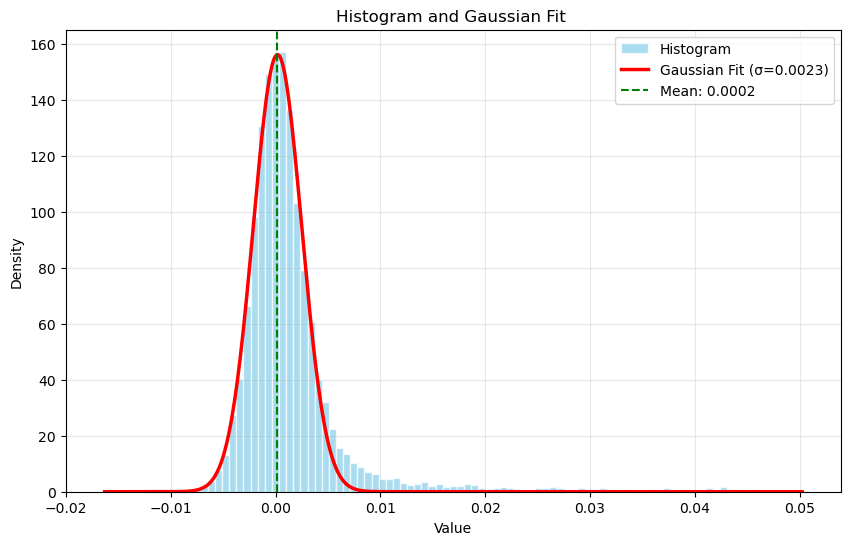

数据统计: 最小值=-0.0140, 最大值=0.0499, 均值=0.0009
------------------------开始拟合---------------------
初始估计: 幅度=177.9832, 均值=0.0002, 标准差=0.0100
拟合成功: 幅度=177.9848, 均值=0.0001, 标准差=0.0021


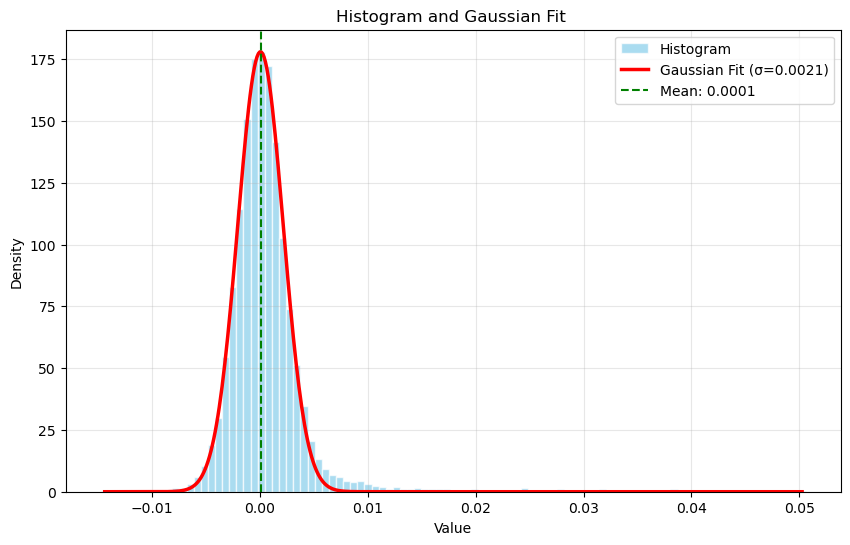

数据统计: 最小值=-0.0168, 最大值=0.0499, 均值=0.0009
------------------------开始拟合---------------------
初始估计: 幅度=186.9692, 均值=0.0001, 标准差=0.0100
拟合成功: 幅度=180.6665, 均值=0.0000, 标准差=0.0021


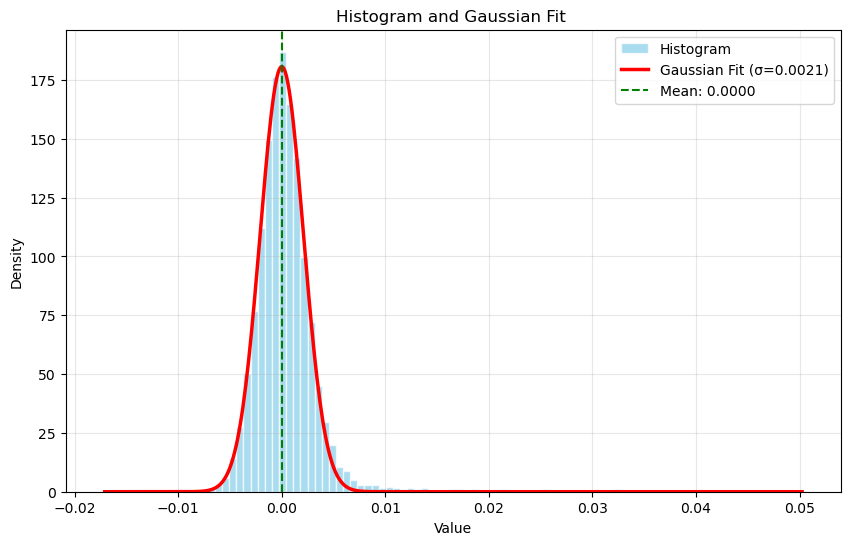

In [6]:
# 把五个spw合并，用直方图求标准差
spw_std=[]
for n in range(len(target_name)):
    all_spectrum=[]
    filter_spectrum=[]
    for i in range(len(data)):
        if name_list[i]==target_name[n]:
            x,y=data_to_xy(data[i])
            all_spectrum.extend(y)
    filter_spectrum=[x for x in all_spectrum if x<=0.05]
    std=histogram_ds(filter_spectrum)
    spw_std.append(std)

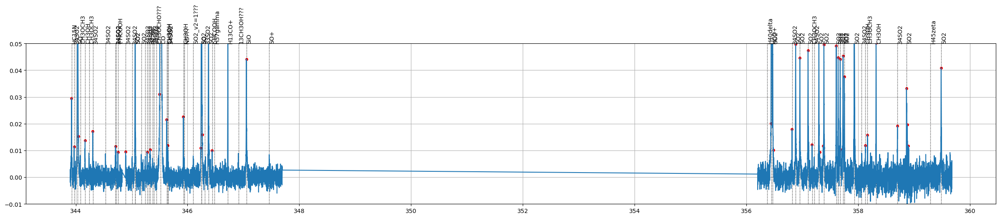

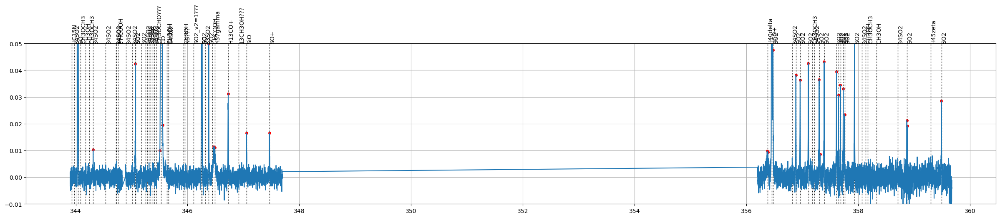

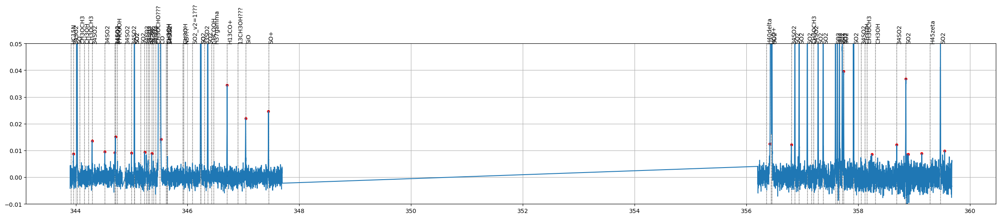

In [7]:
# 将标准谱线与数据对比，寻找峰值
    
target_x=[[] for i in range(3)]  # 把源的x和y提出来，一个[]装一个源的所有谱线的数据
target_y=[[] for i in range(3)] 
peak_list=[] 

for n in range(len(target_name)):
    
    for i in range(len(data)):
        if name_list[i]==target_name[n]:
            x,y=data_to_xy(data[i])
            target_x[n].extend(x)
            target_y[n].extend(y)
    peaks, properties = find_peaks(target_y[n], height=4*spw_std[n],distance=25)
    peak_list.append(list(peaks))
    
    plt.figure(figsize=(30,5))
    plt.ylim(-0.01,0.05)
    plt.grid()
    for j in range(len(peaks)):
        plt.plot(target_x[n][peaks[j]],target_y[n][peaks[j]],marker='o',color='red',markersize=4)
    
    # 获取视向速度
    target_velocity=dic_v[target_name[n]]
    # 把静止频率修正
    spectrum_fre_v=[]
    for i in range(len(spectrum_fre)):
        spectrum_fre_v.append(spectrum_fre[i]*(1-target_velocity*10e3/(3.0*10e8)))
    
    
    for j in range(len(spectrum_name)):
        plt.axvline(x=spectrum_fre_v[j], color="black", linestyle=":", linewidth=1) # 标准谱线已根据速度修正
        plt.text(
            spectrum_fre_v[j],  # 文本X位置（竖线右侧）
            0.05,  # 文本Y位置
            spectrum_name[j], 
            rotation=90,  # 垂直旋转
            color="black",
            va="bottom"   # 垂直对齐
            )
    plt.plot(target_x[n],target_y[n])
    plt.show()
    

In [8]:
# 把谱线挑出来放大
x_large=[]       
y_large=[]
for i in range(len(peak_list)):
    x_large_tem,y_large_tem=enlarge2(peak_list[i],target_x[i],target_y[i],dic_v[target_name[i]])
    x_large.append(x_large_tem)
    y_large.append(y_large_tem)

In [9]:
print(len(x_large[2][0]))

90


HC15N
0-0


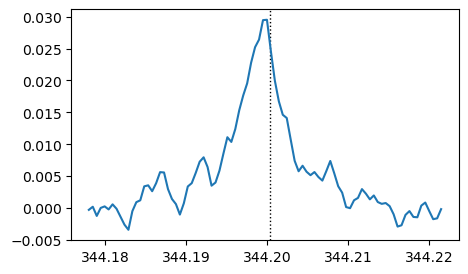

34SO2
0-1


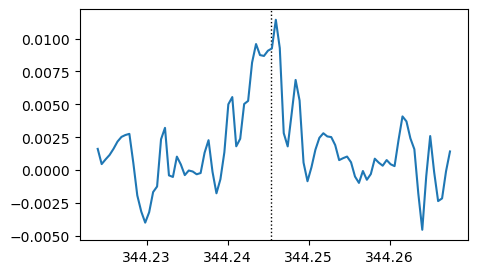

SO
0-2


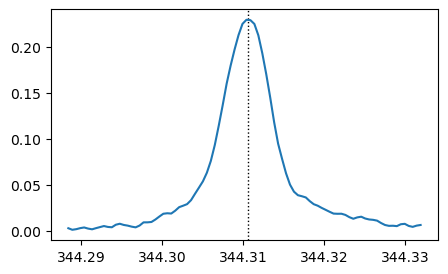

SO
0-3


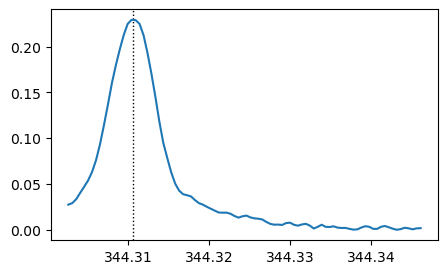

CH3OH
0-4


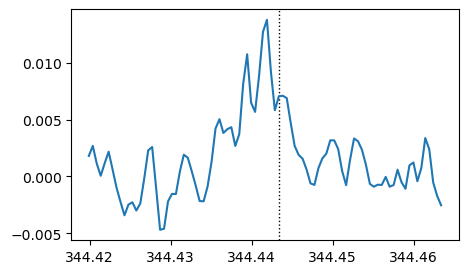

34SO2
0-5


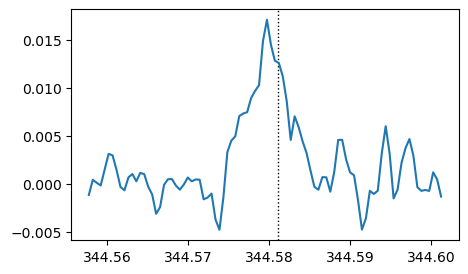

34SO2
0-6


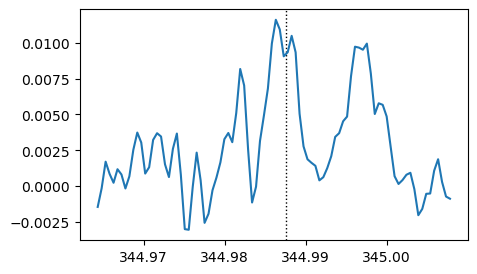

t-HCOOH
0-7


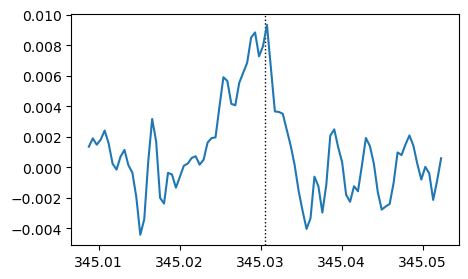

34SO2
0-8


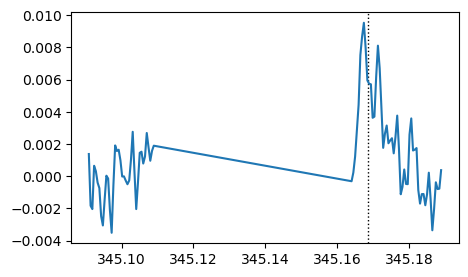

SO2
0-9


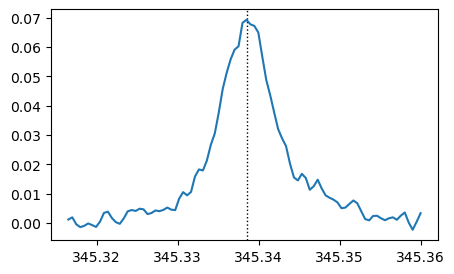

34SO2
0-10


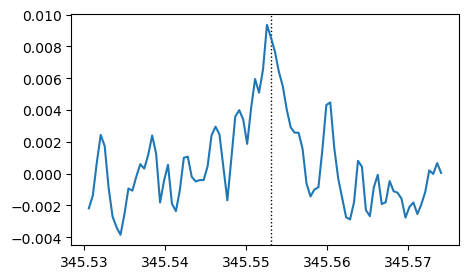

HC3N
0-11


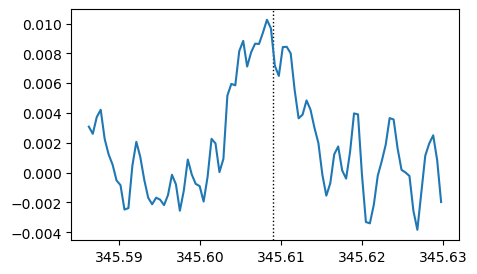

CO
0-12


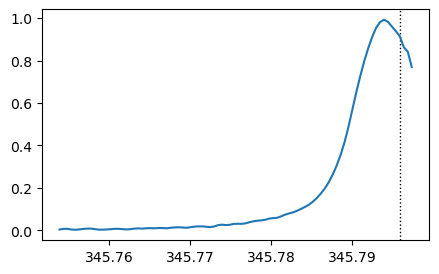

CO
0-13


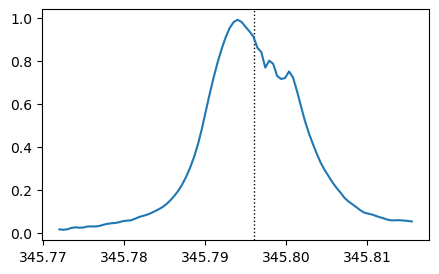

CO
0-14


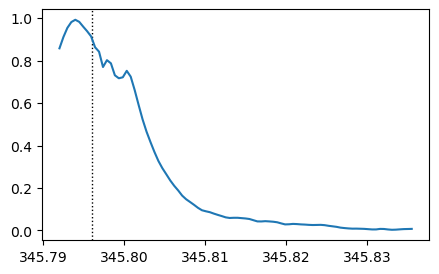

CH3OH
0-15


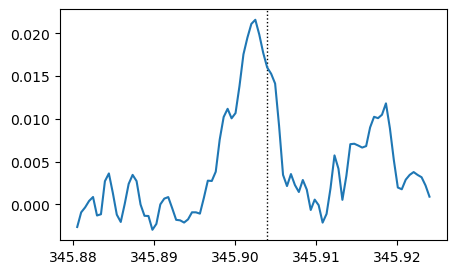

CH3OH
0-16


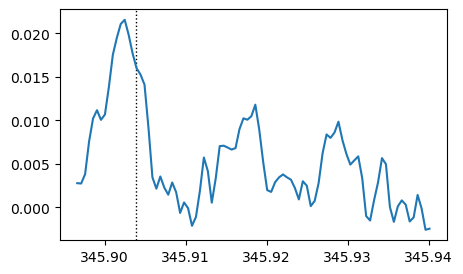

CH3OH
0-17


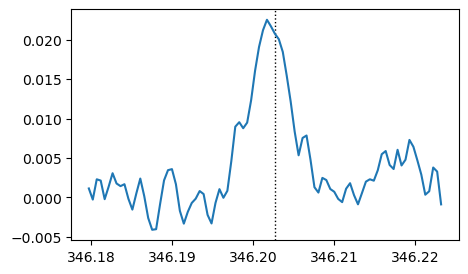

SO
0-18


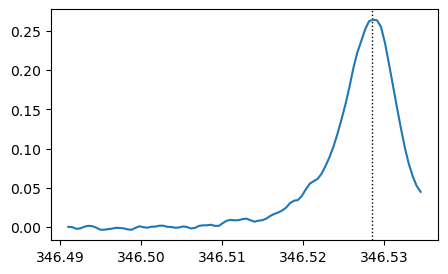

SO
0-19


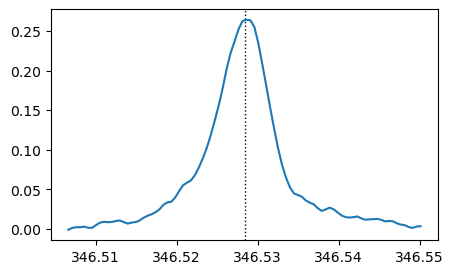

SO
0-20


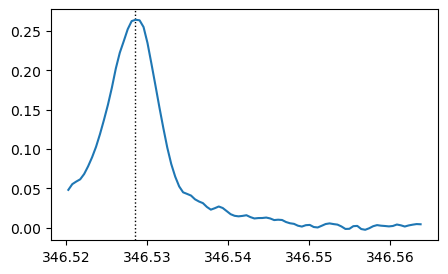

SO2
0-21


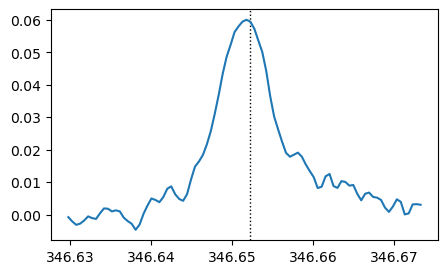

t-HCOOH
0-22


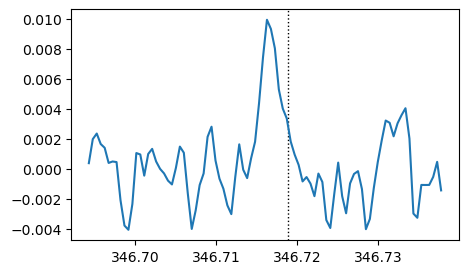

H13CO+
0-23


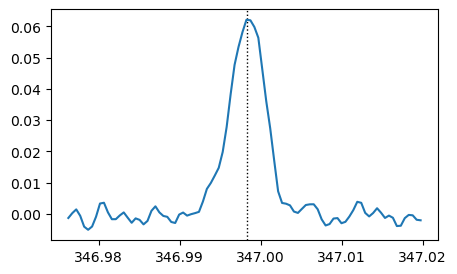

SiO
0-24


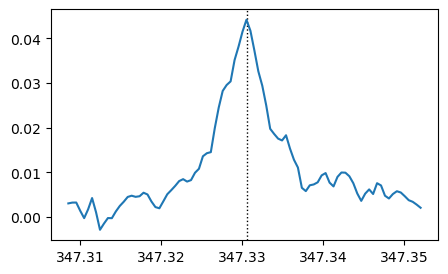

HCO+
0-25


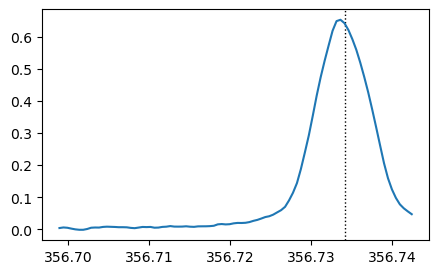

HCO+
0-26


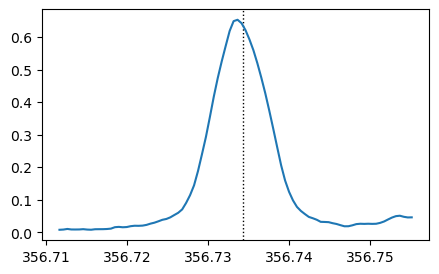

HCO+
0-27


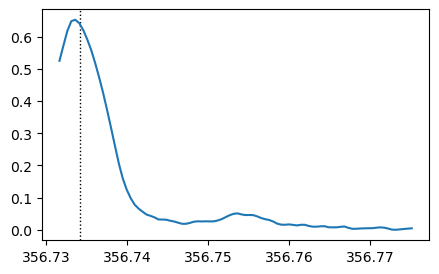

SO2
0-28


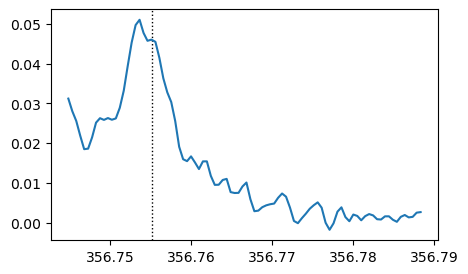

34SO2
0-29


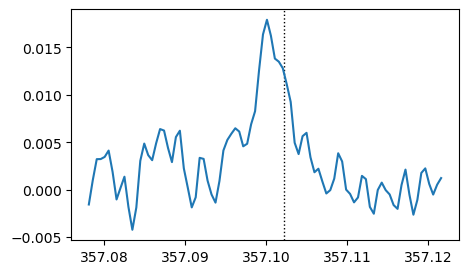

SO2
0-30


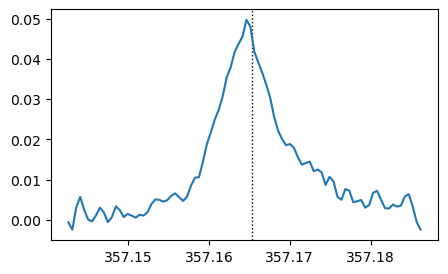

SO2
0-31


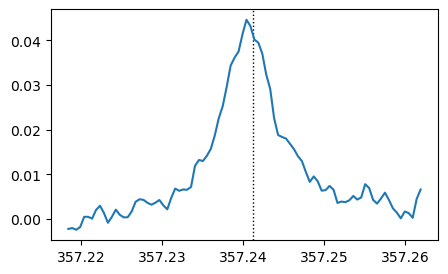

SO2
0-32


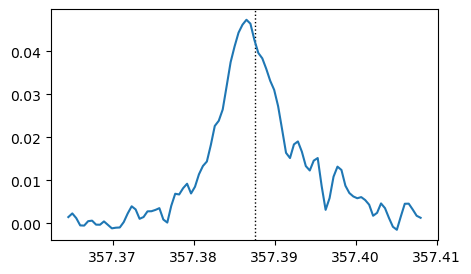

CH3OCH3
0-33


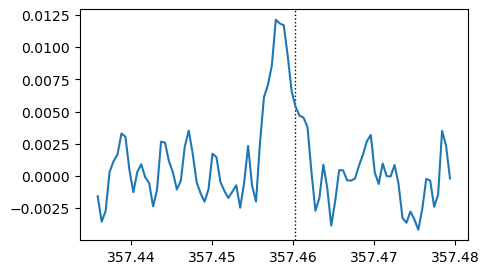

SO2
0-34


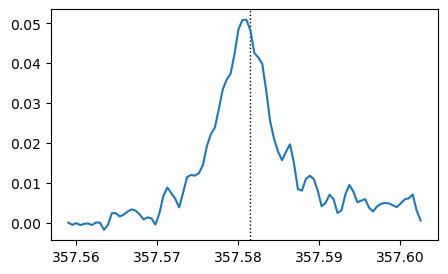

SO2
0-35


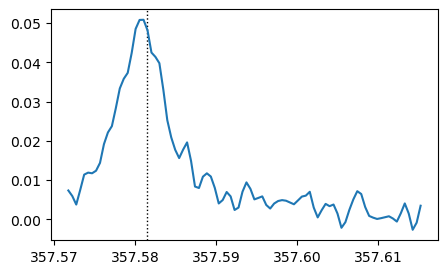

SO2
0-36


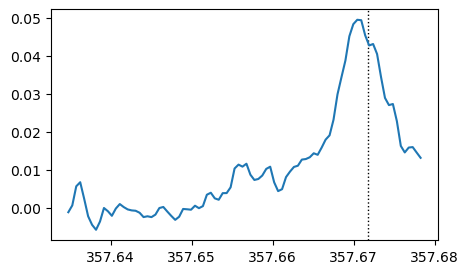

SO2
0-37


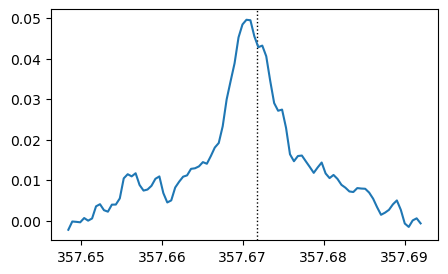

SO2
0-38


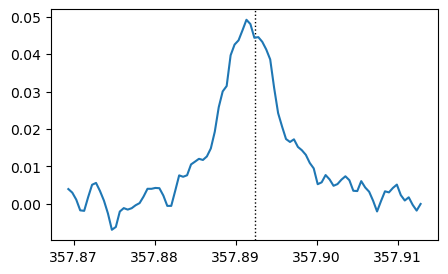

SO2
0-39


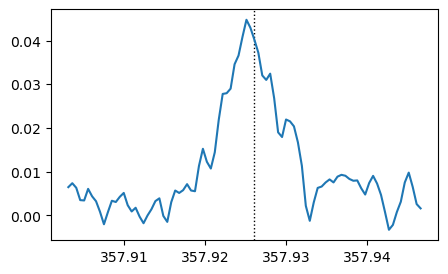

SO2
0-40


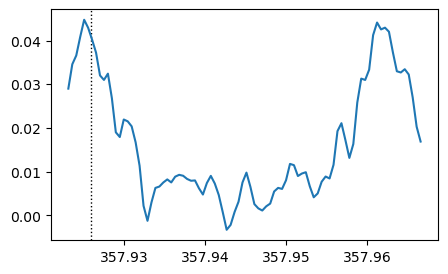

SO2
0-41


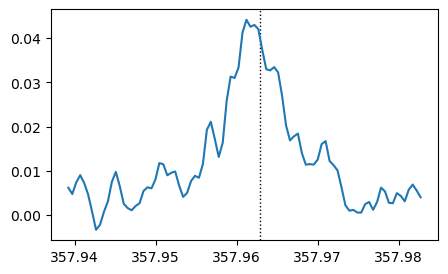

SO2
0-42


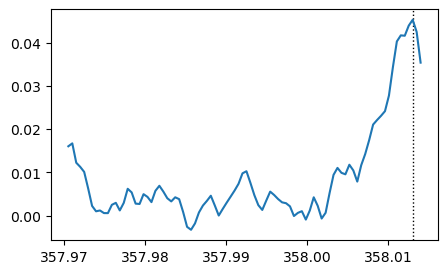

SO2
0-43


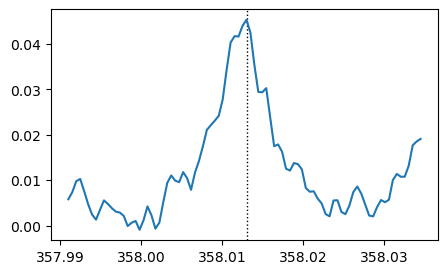

SO2
0-44


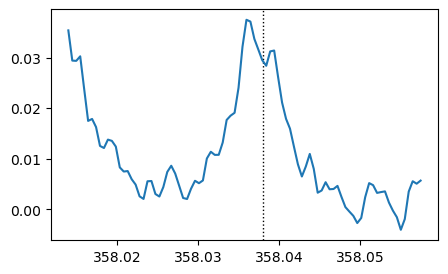

SO2
0-45


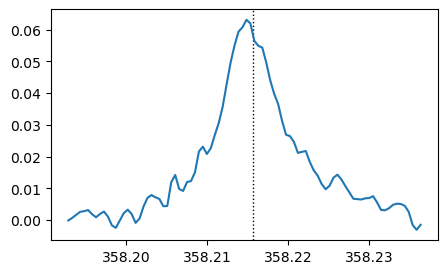

SO2
0-46


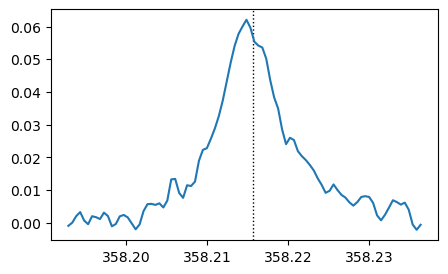

CH3OH
0-47


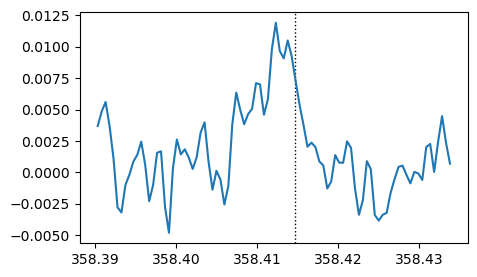

CH3OCH3
0-48


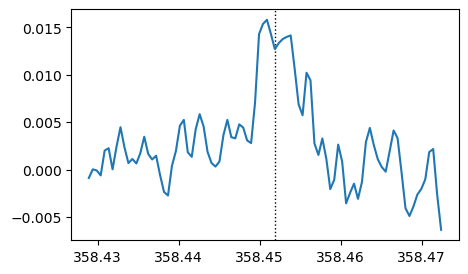

CH3OH
0-49


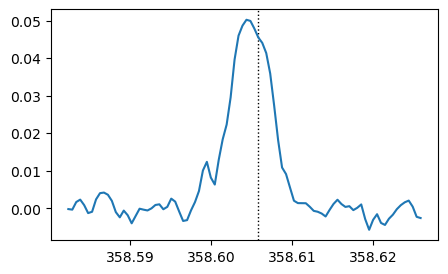

34SO2
0-50


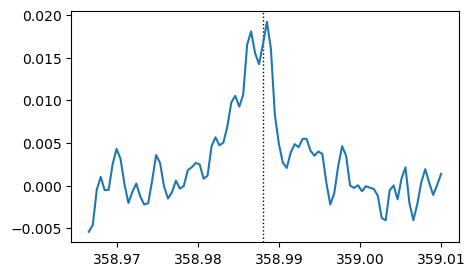

SO2
0-51


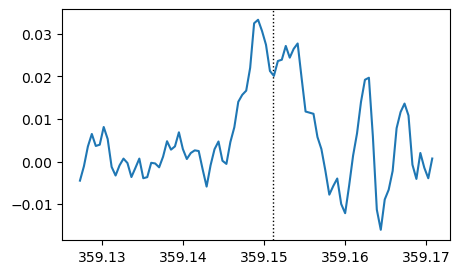

SO2
0-52


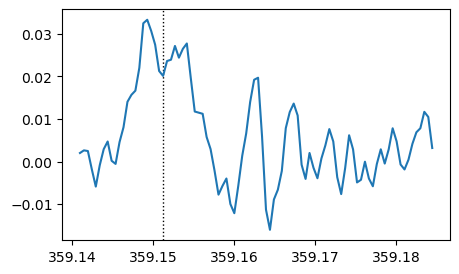

SO2
0-54


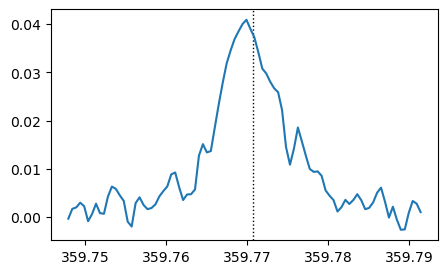

SO
1-0


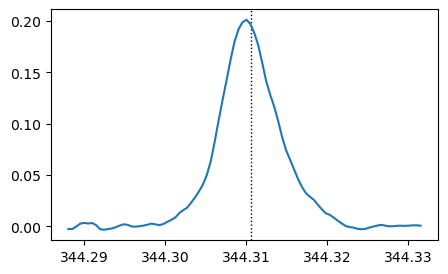

34SO2
1-1


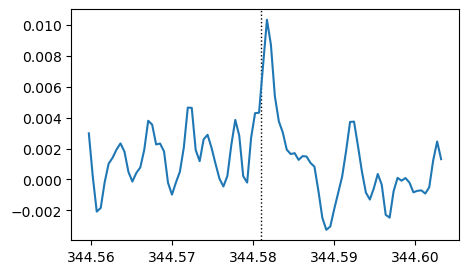

SO2
1-2


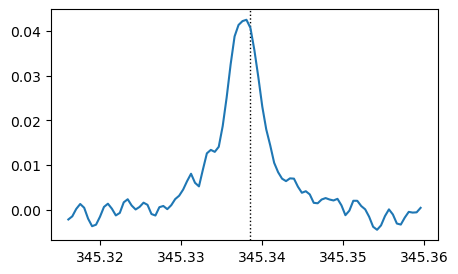

CO
1-3


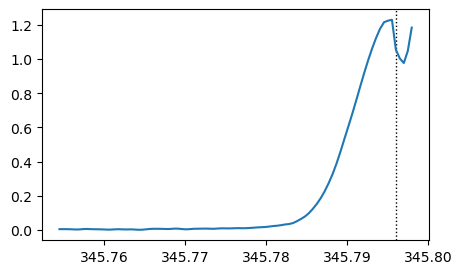

CO
1-4


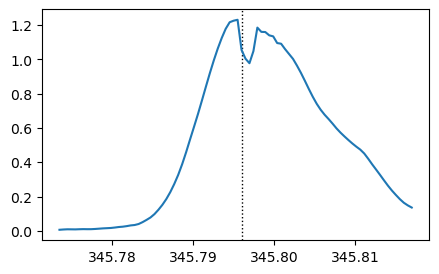

SO
1-6


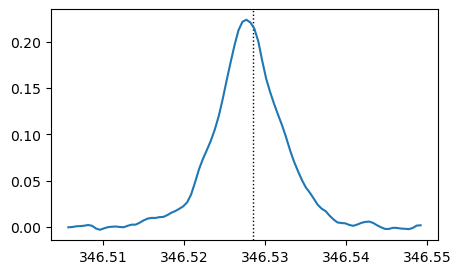

SO2
1-7


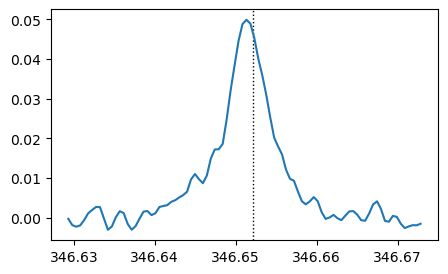

H13CO+
1-10


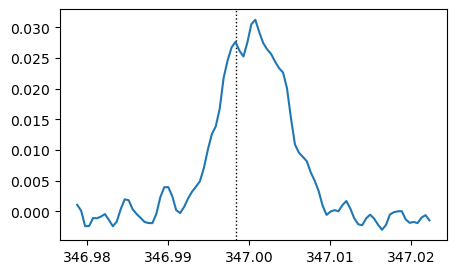

SiO
1-11


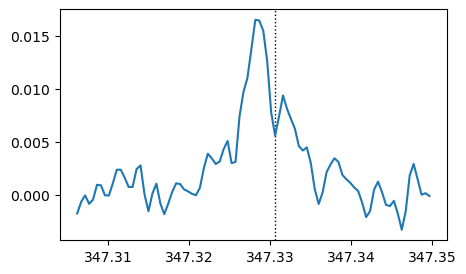

SO+
1-12


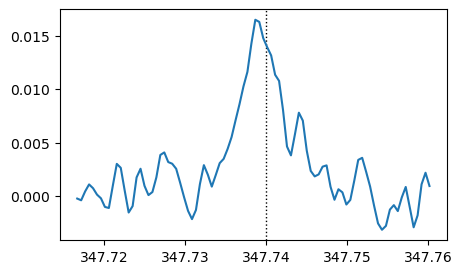

H40delta
1-13


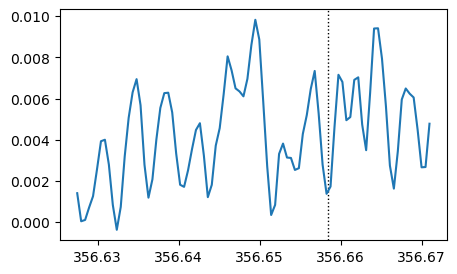

H40delta
1-14


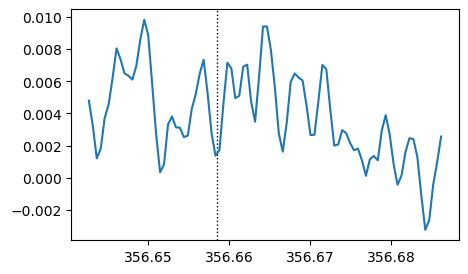

HCO+
1-15


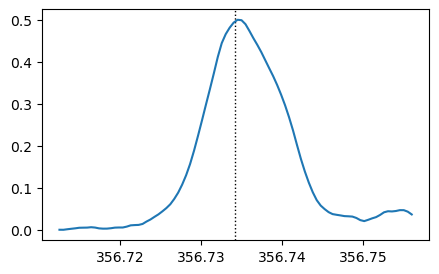

HCO+
1-16


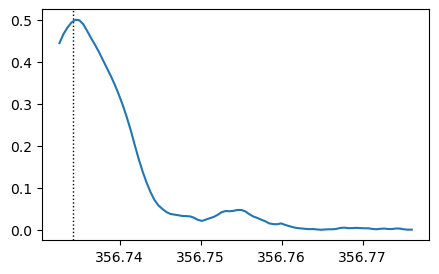

SO2
1-17


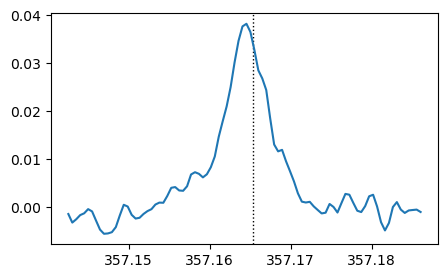

SO2
1-18


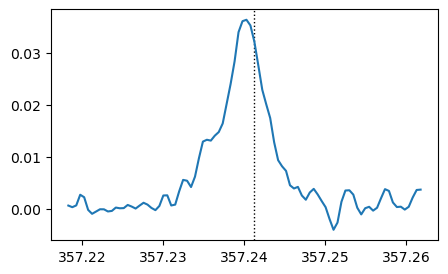

SO2
1-19


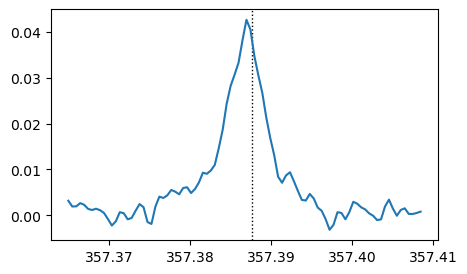

SO2
1-20


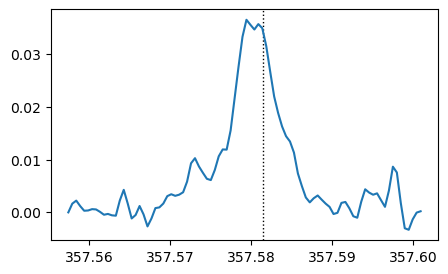

SO2
1-21


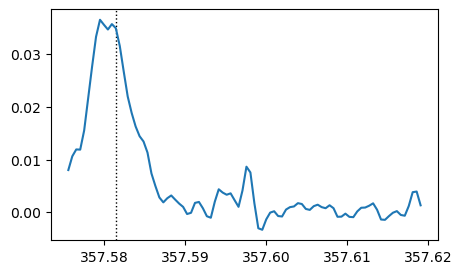

SO2
1-22


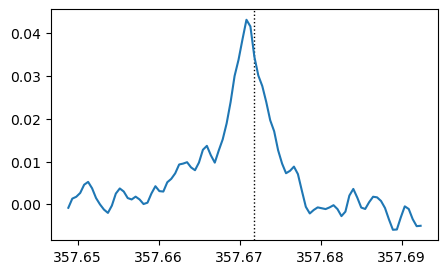

SO2
1-23


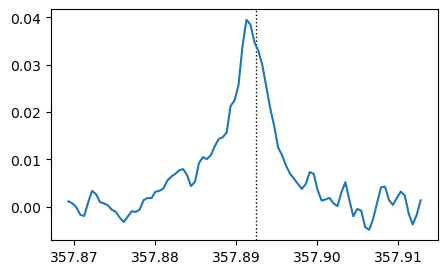

SO2
1-24


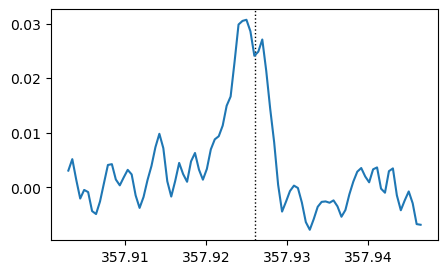

SO2
1-25


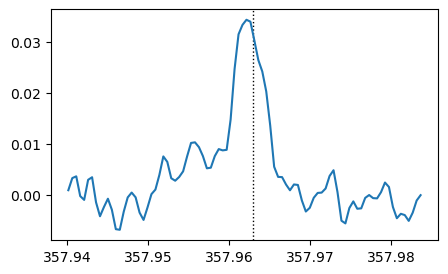

SO2
1-26


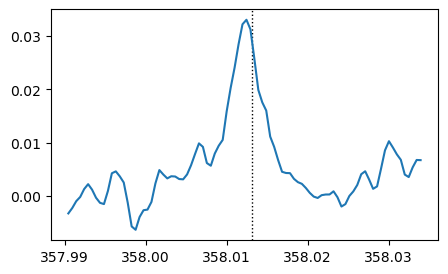

SO2
1-27


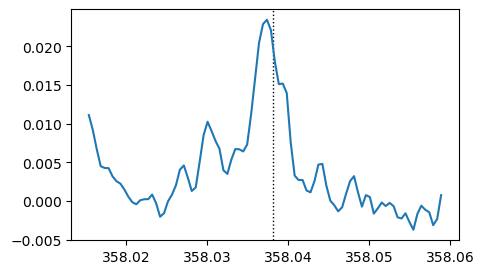

SO2
1-28


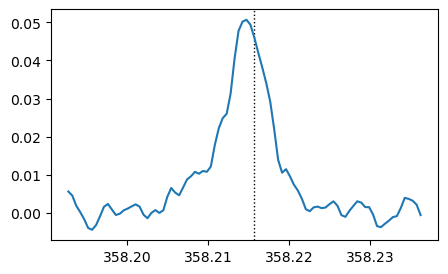

SO2
1-29


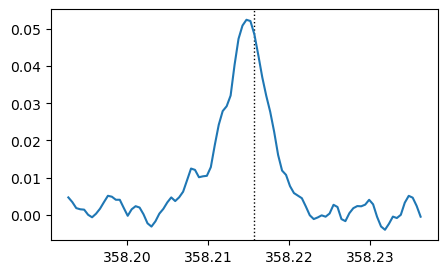

SO2
1-30


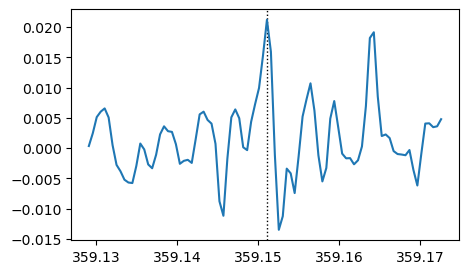

SO2
1-31


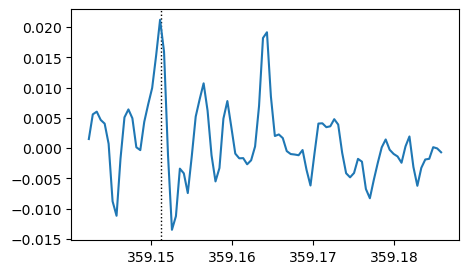

SO2
1-32


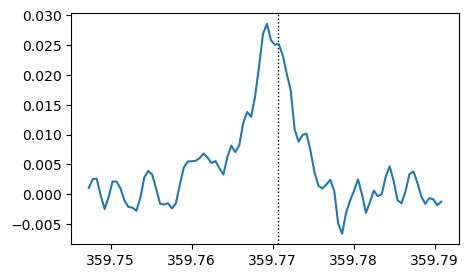

34SO2
2-0


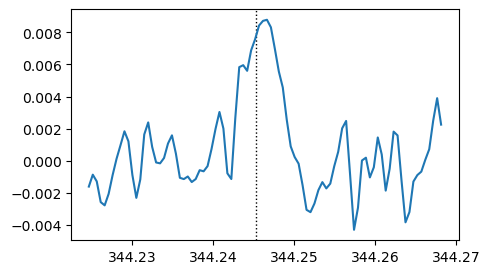

SO
2-1


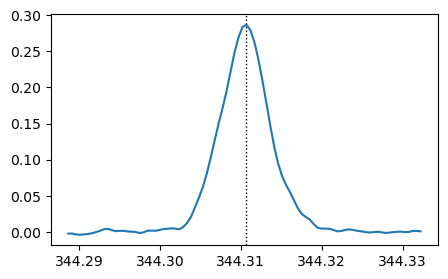

34SO2
2-2


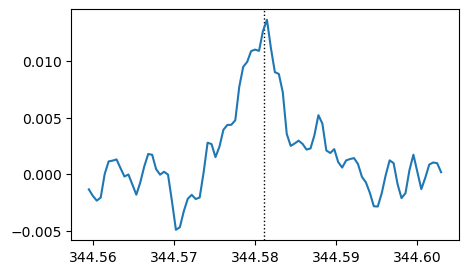

34SO2
2-3


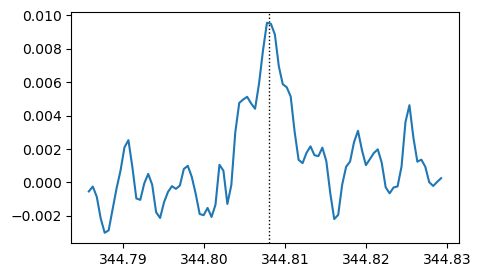

34SO2
2-4


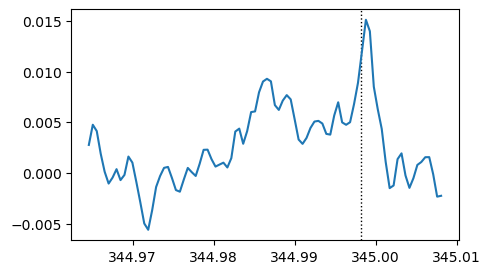

34SO2
2-5


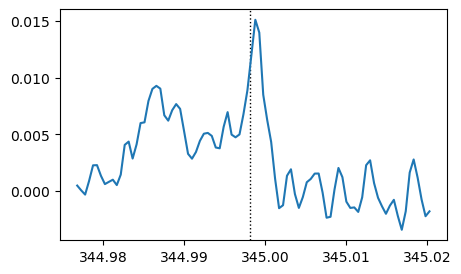

34SO2
2-6


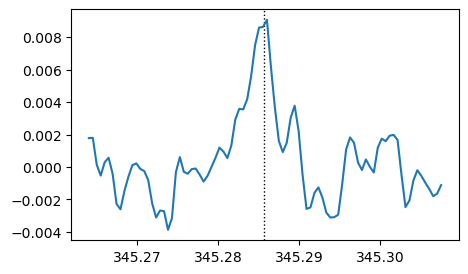

SO2
2-7


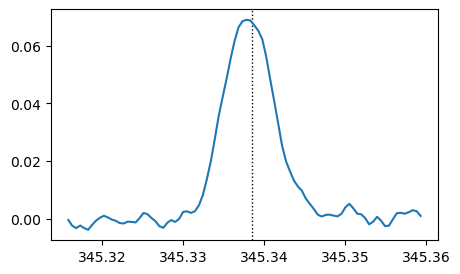

34SO2
2-8


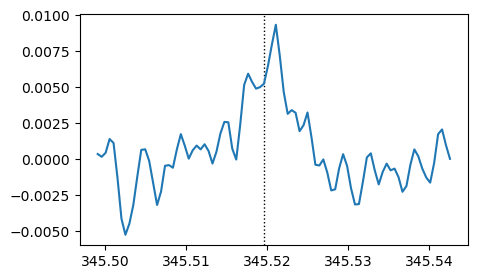

34SO2
2-9


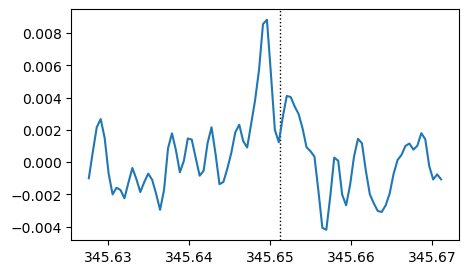

CO
2-10


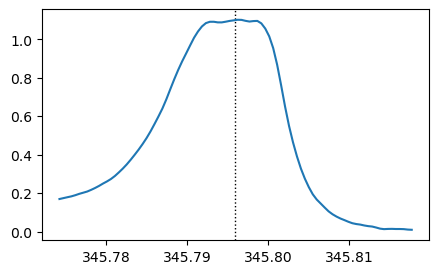

CO
2-11


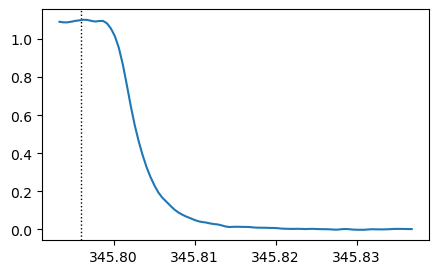

SO
2-12


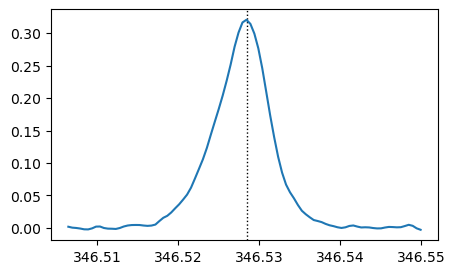

SO2
2-13


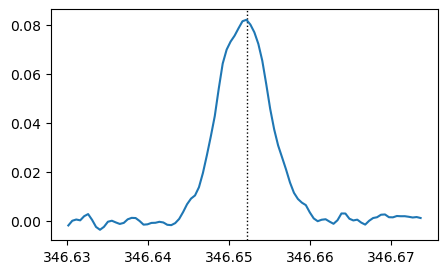

H13CO+
2-14


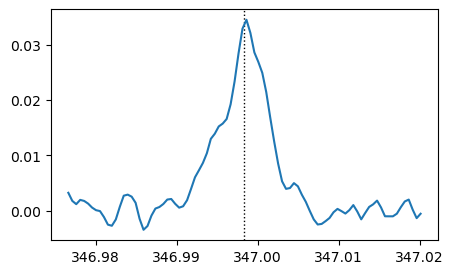

SiO
2-15


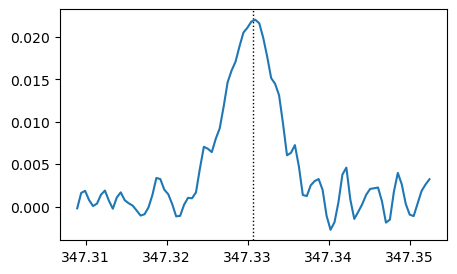

SO+
2-16


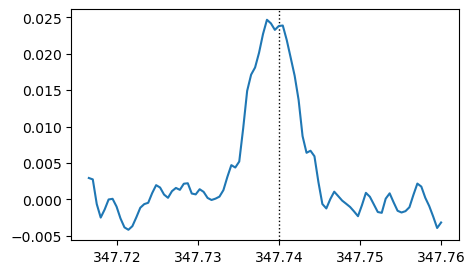

HCO+
2-17


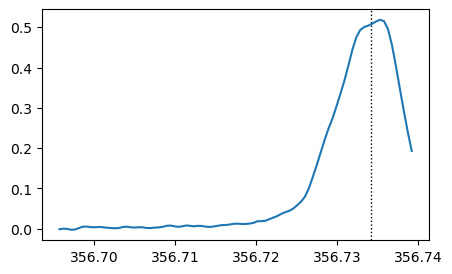

HCO+
2-18


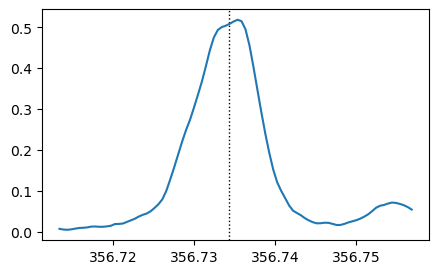

HCO+
2-19


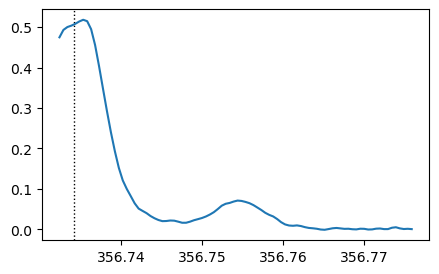

34SO2
2-20


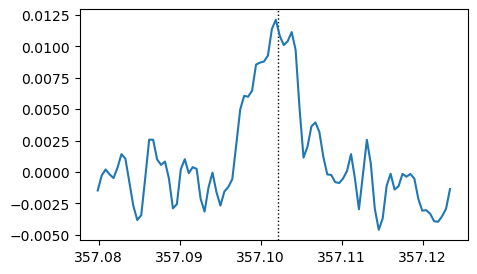

SO2
2-21


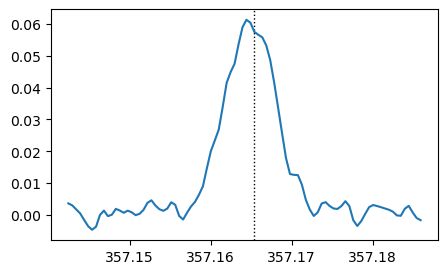

SO2
2-22


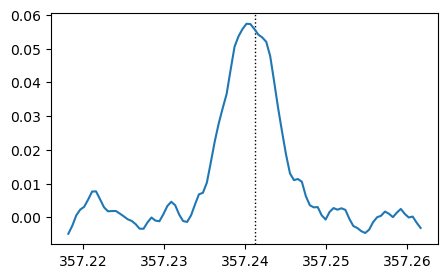

SO2
2-23


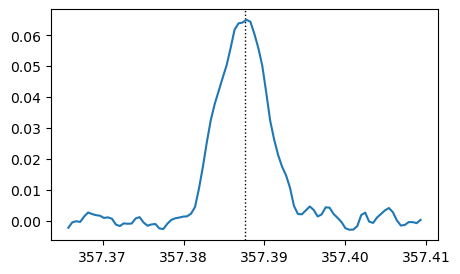

SO2
2-24


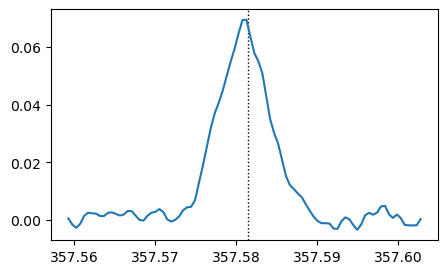

SO2
2-25


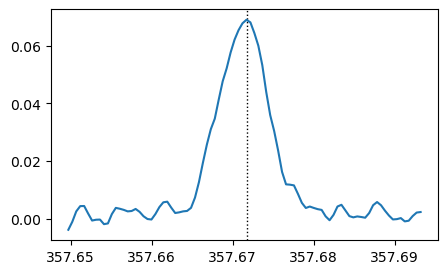

SO2
2-26


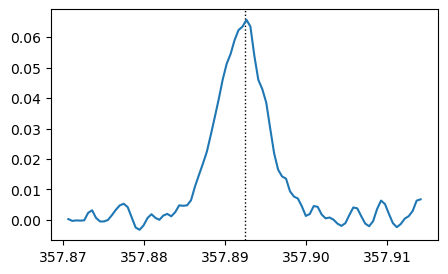

SO2
2-27


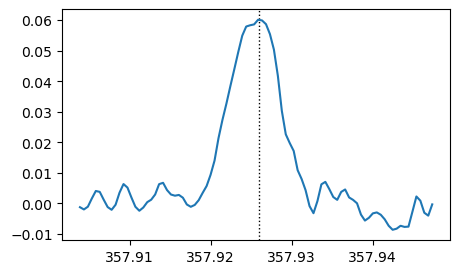

SO2
2-28


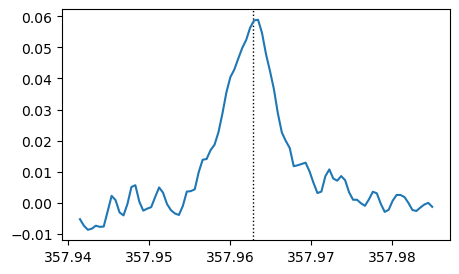

SO2
2-29


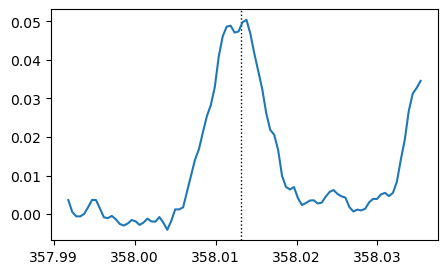

SO2
2-30


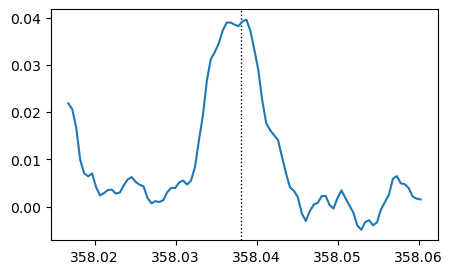

SO2
2-31


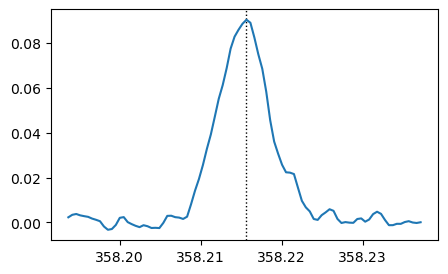

SO2
2-32


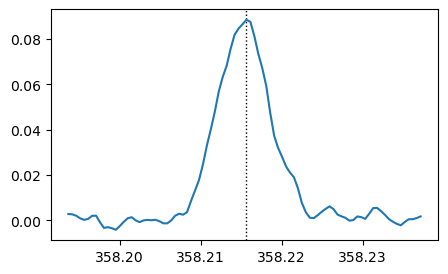

34SO2
2-34


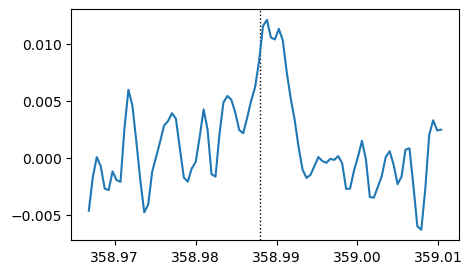

SO2
2-35


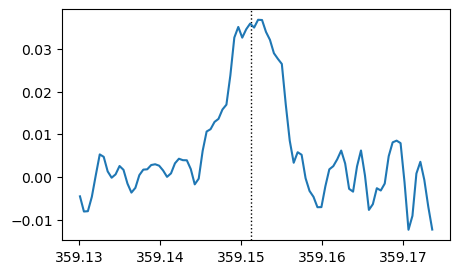

SO2
2-36


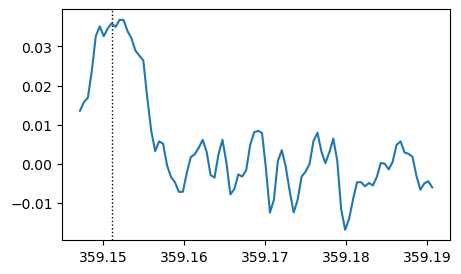

SO2
2-39


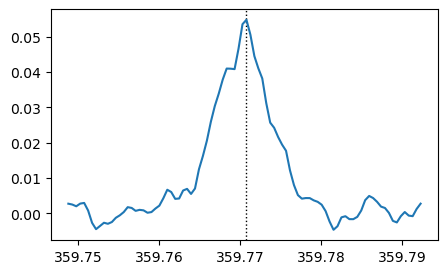

[[53], [5, 8, 9], [33, 37, 38, 40]]


In [10]:
# 画出单独的谱线，并找出每一根谱线的名字 （这个时候还不能把三个源的谱线合并到一起）
peak_name=[[] for i in range(3)]
peak_fre=[[] for i in range(3)]
shan=[[] for i in range(3)]

for n in range(len(x_large)):  # 循环三个源 第n个源
    for i in range(len(x_large[n])):  # 循环每个源中找到的谱线  第i条谱线
        puxian=[]
        for k in range(len(spectrum_fre)):   # 对某一根谱线
            peak_index=y_large[n][i].index(max(y_large[n][i]))  # 找到该区间的峰值
            puxian.append(abs(x_large[n][i][peak_index]-spectrum_fre[k]))  # 计算峰值的频率与所有谱线的频率的差，以谱线表为顺序

        if min(puxian)<0.01:  # 如果差值小于一定值
            puxian_index=puxian.index(min(puxian))   # 则认为差值最小的就是该谱线，记录这条谱线在谱线表中的位置为puxian_index
            print(spectrum_name[puxian_index])    # 输出谱线名字
            print("{}-{}".format(n,i))  # 输出这是总谱线表中的第几个源的第几条谱线
            peak_name[n].append(spectrum_name[puxian_index])  # 将这个谱线的名字记录在peak_name中
            peak_fre[n].append(spectrum_fre[puxian_index])   # 将这个谱线的静止频率记录在peak_fre中
            # 画图
            plt.figure(figsize=(5,3))
            plt.axvline(x=spectrum_fre[puxian_index], color="black", linestyle=":", linewidth=1)
            plt.plot(x_large[n][i],y_large[n][i])
            plt.ticklabel_format(useOffset=False, style='plain')
            plt.show()
        else:   # 如果差值都很大，认为这个点为误差点，不代表任何谱线，记录这个点的位置，待会删掉
            shan[n].append(i)
        
print(shan)

In [11]:
# 删掉找不到的谱线
for n in range(len(shan)):
    for i in range(len(shan[n])-1,-1,-1):
    #     print(i)
        del x_large[n][shan[n][i]]
        del y_large[n][shan[n][i]]

In [12]:
# 删除峰值偏离中心的谱线
shan2=[[] for i in range(3)]
for n in range(len(y_large)):
    for i in range(len(y_large[n])):
        max_index=y_large[n][i].index(max(y_large[n][i]))
        if max_index>75 or max_index<25:
            shan2[n].append(i)
            
for n in range(len(shan2)):
    for i in range(len(shan2[n])-1,-1,-1):
    #     print(i)
        del x_large[n][shan2[n][i]]
        del y_large[n][shan2[n][i]]
        del peak_fre[n][shan2[n][i]]
        del peak_name[n][shan2[n][i]]

HC15N
0-0


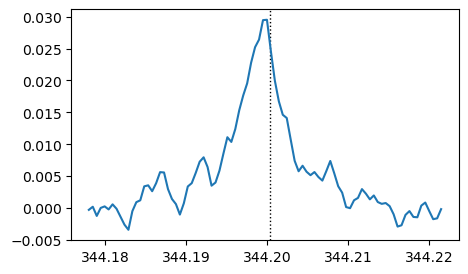

34SO2
0-1


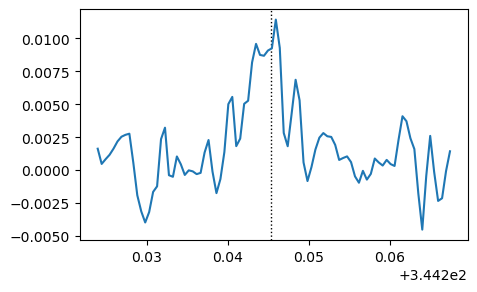

SO
0-2


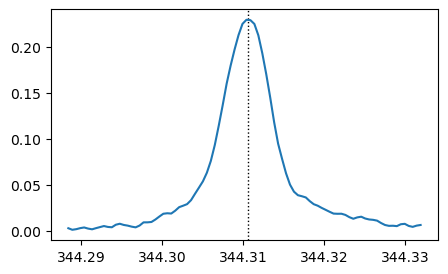

CH3OH
0-3


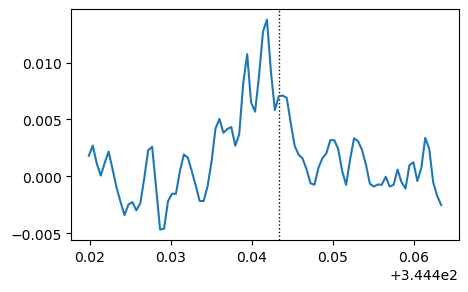

34SO2
0-4


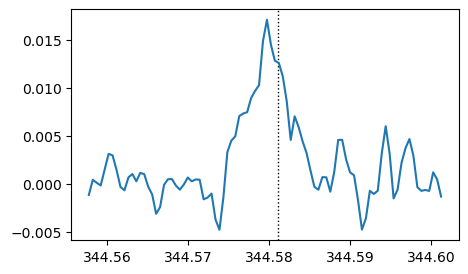

34SO2
0-5


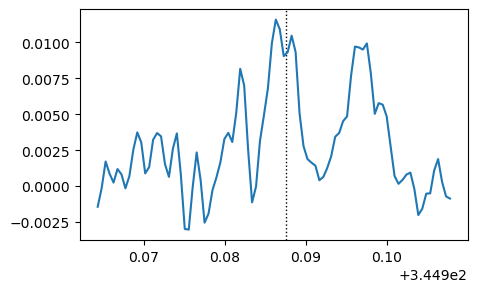

t-HCOOH
0-6


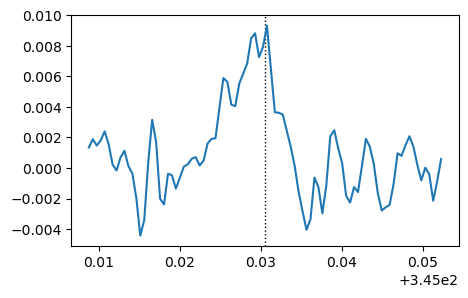

34SO2
0-7


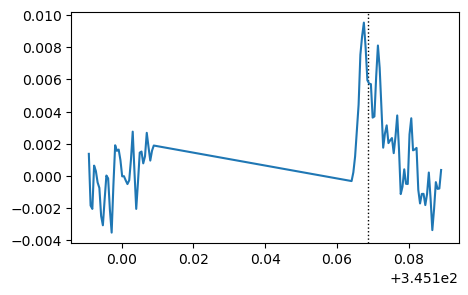

SO2
0-8


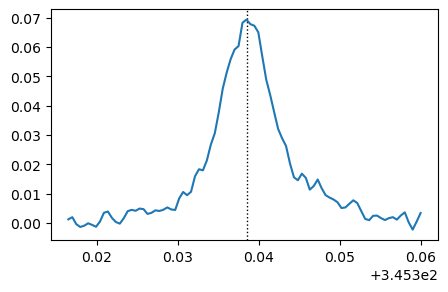

34SO2
0-9


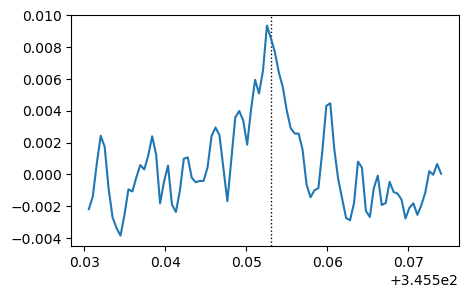

HC3N
0-10


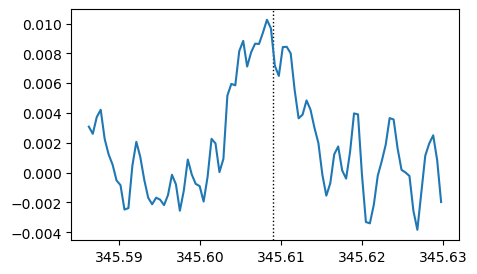

CO
0-11


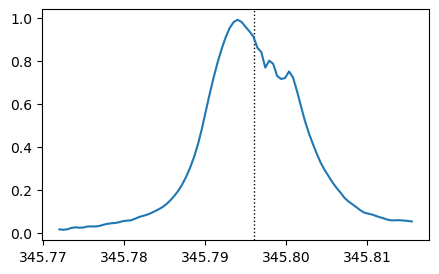

CH3OH
0-12


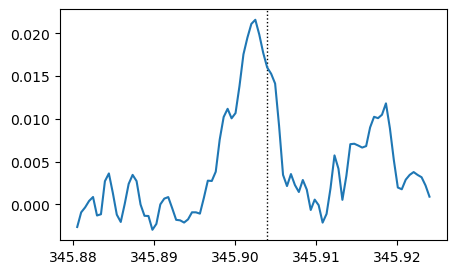

CH3OH
0-13


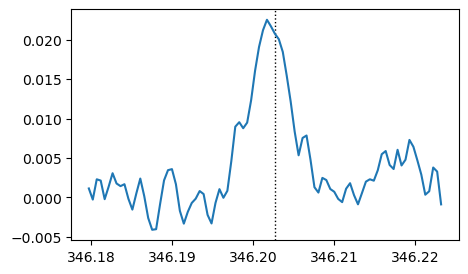

SO
0-14


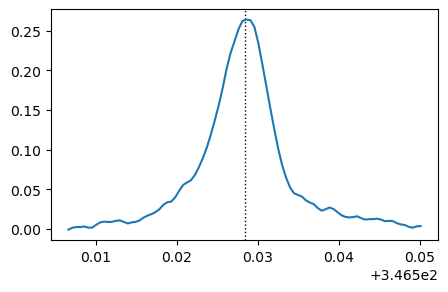

SO2
0-15


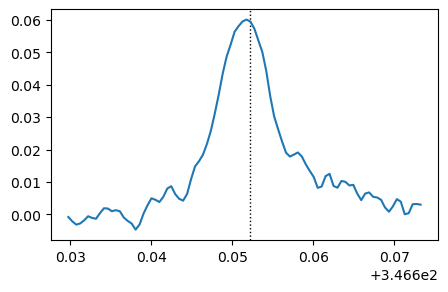

t-HCOOH
0-16


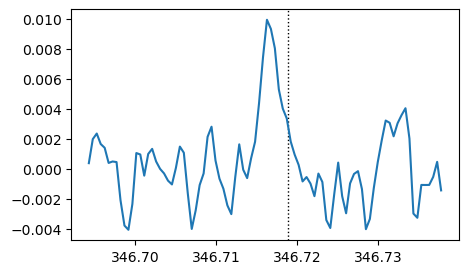

H13CO+
0-17


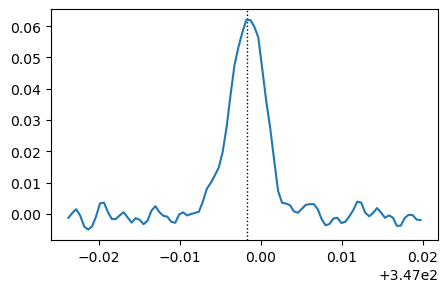

SiO
0-18


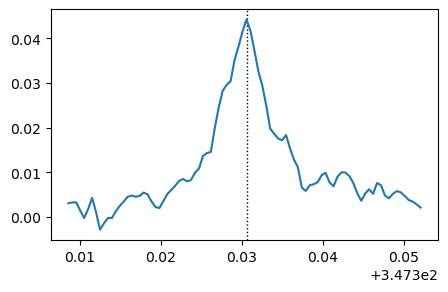

HCO+
0-19


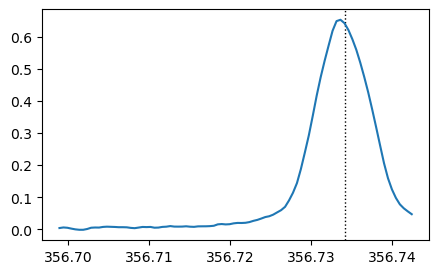

HCO+
0-20


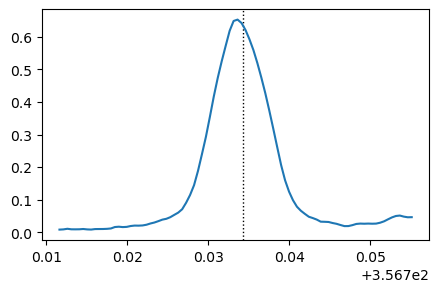

34SO2
0-21


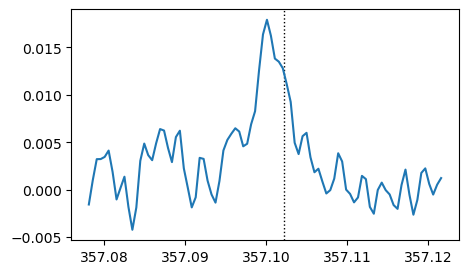

SO2
0-22


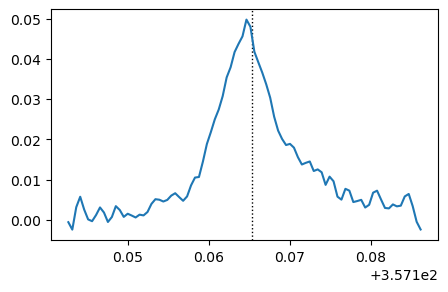

SO2
0-23


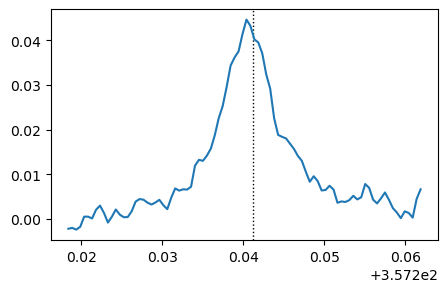

SO2
0-24


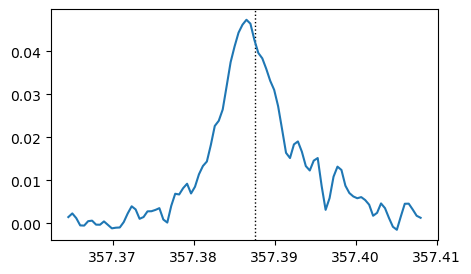

CH3OCH3
0-25


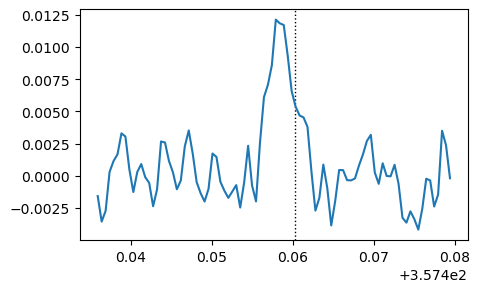

SO2
0-26


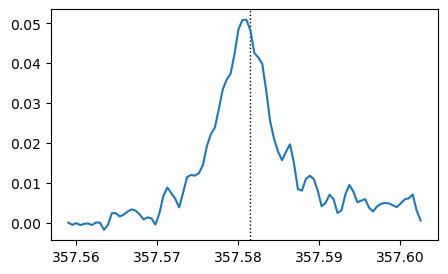

SO2
0-27


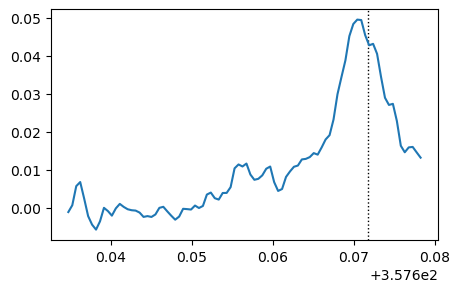

SO2
0-28


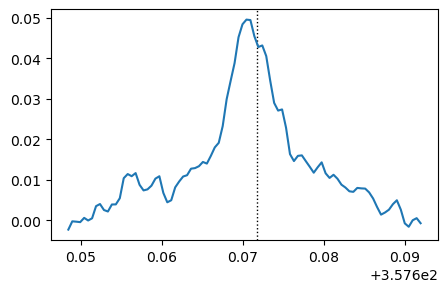

SO2
0-29


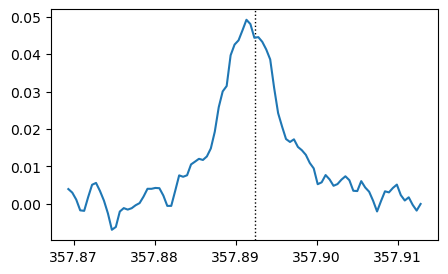

SO2
0-30


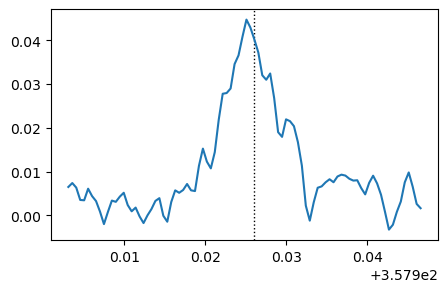

SO2
0-31


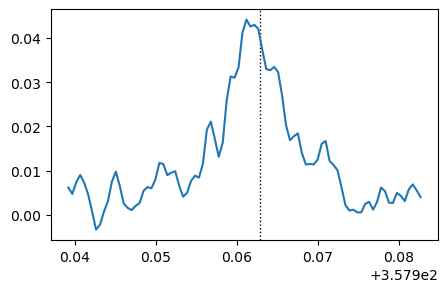

SO2
0-32


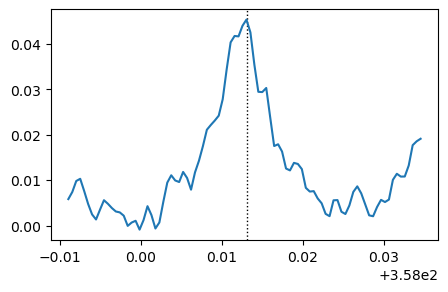

SO2
0-33


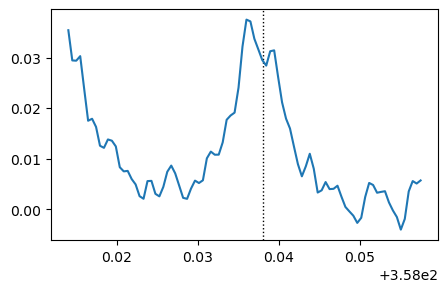

SO2
0-34


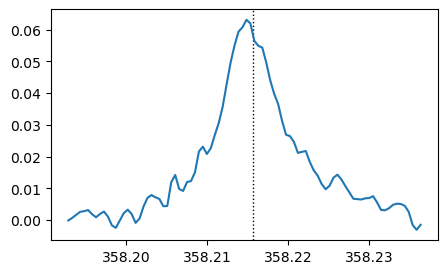

SO2
0-35


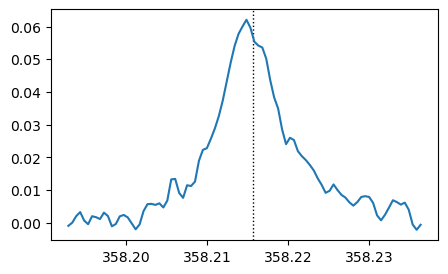

CH3OH
0-36


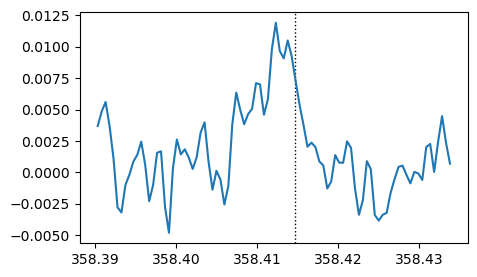

CH3OCH3
0-37


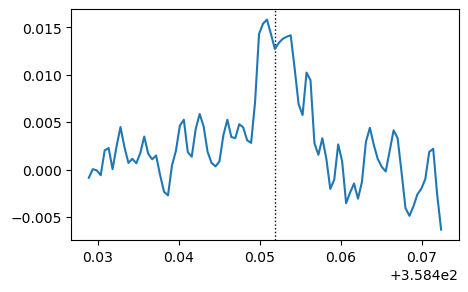

CH3OH
0-38


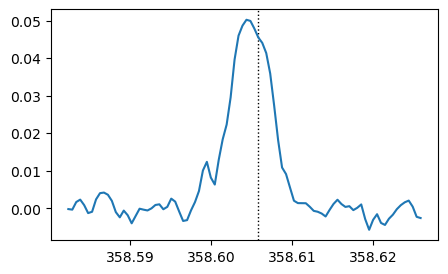

34SO2
0-39


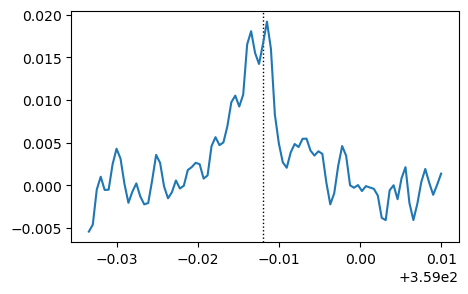

SO2
0-40


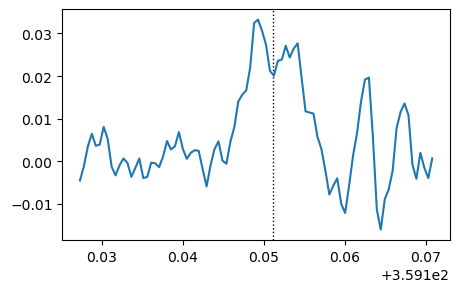

SO2
0-41


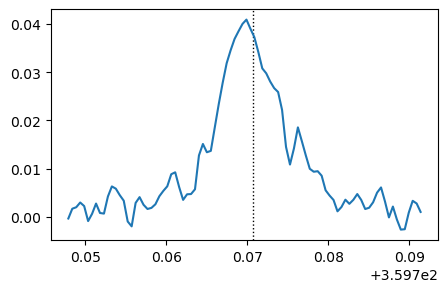

SO
1-0


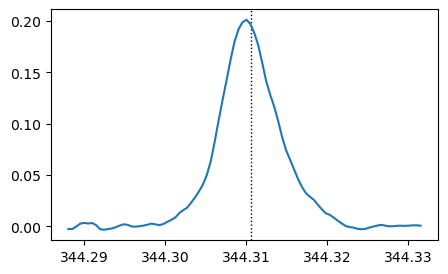

34SO2
1-1


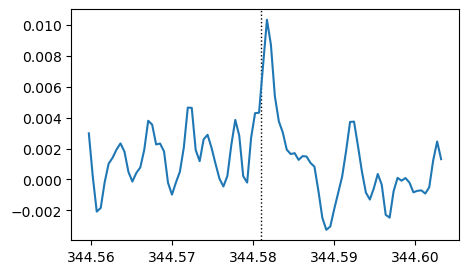

SO2
1-2


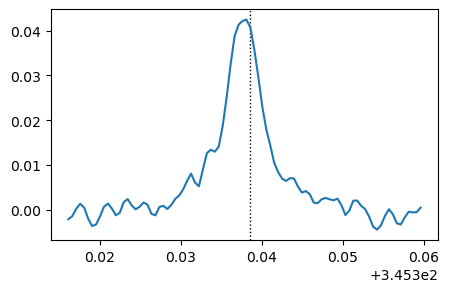

CO
1-3


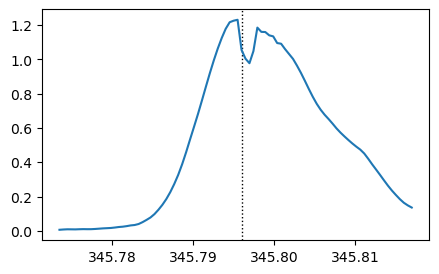

SO
1-4


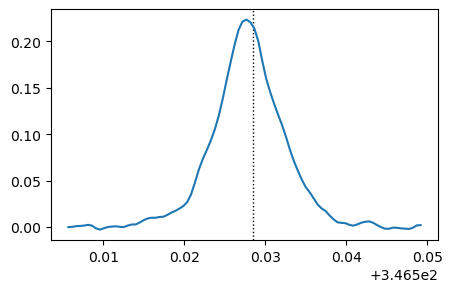

SO2
1-5


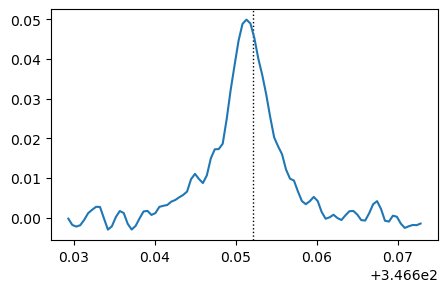

H13CO+
1-6


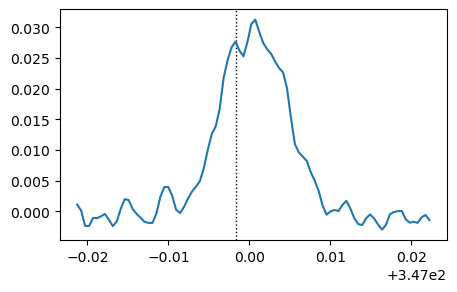

SiO
1-7


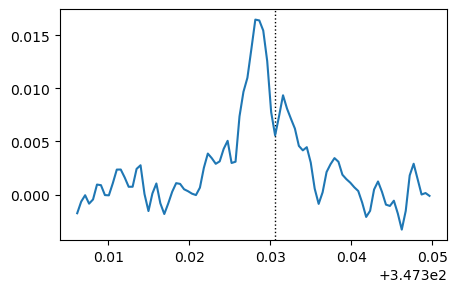

SO+
1-8


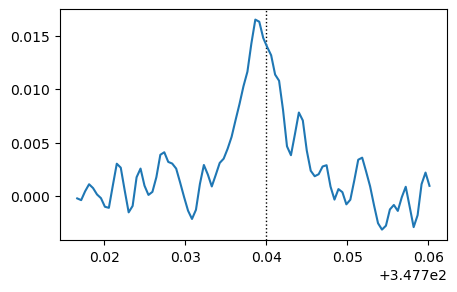

H40delta
1-9


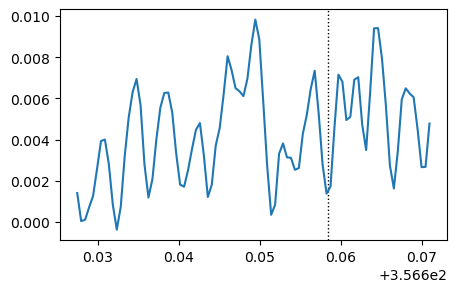

HCO+
1-10


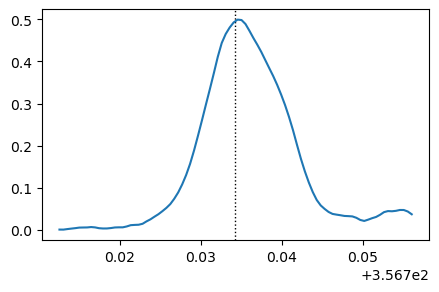

SO2
1-11


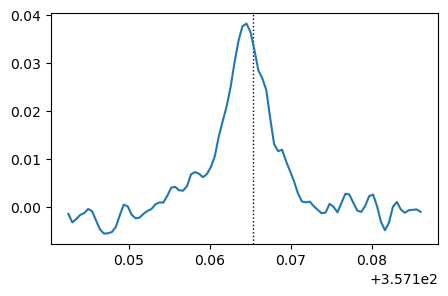

SO2
1-12


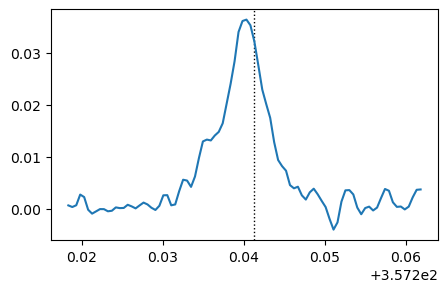

SO2
1-13


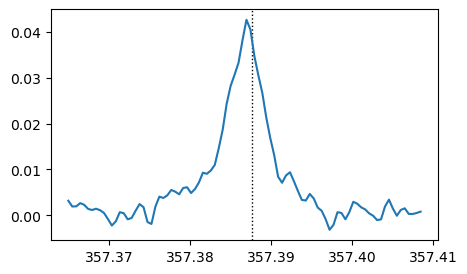

SO2
1-14


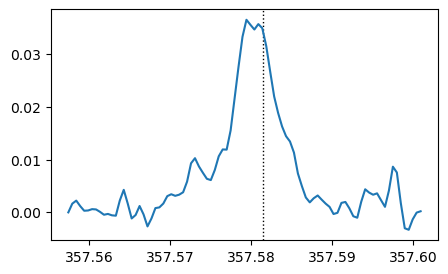

SO2
1-15


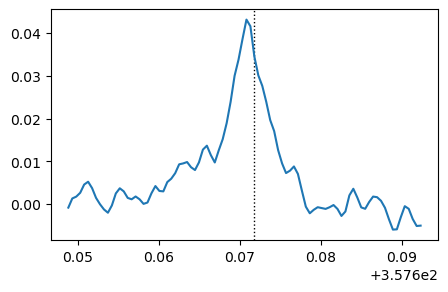

SO2
1-16


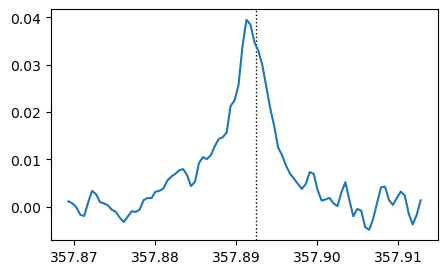

SO2
1-17


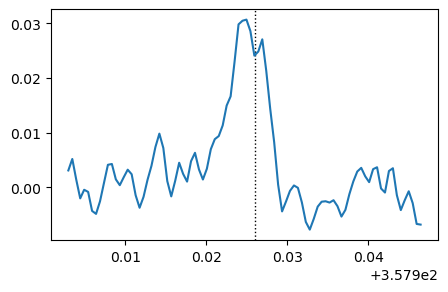

SO2
1-18


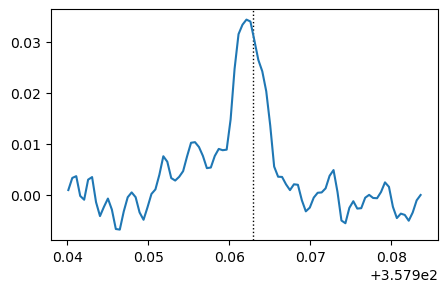

SO2
1-19


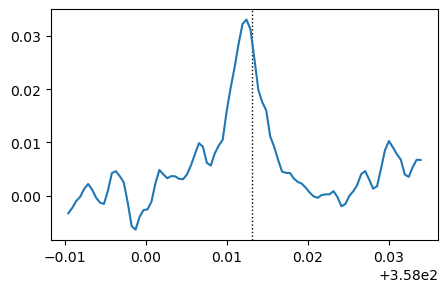

SO2
1-20


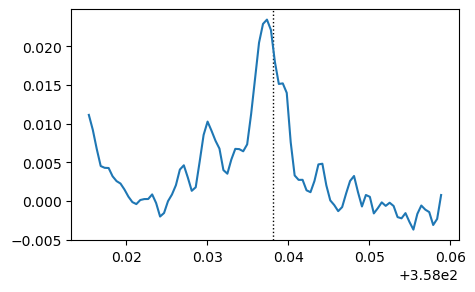

SO2
1-21


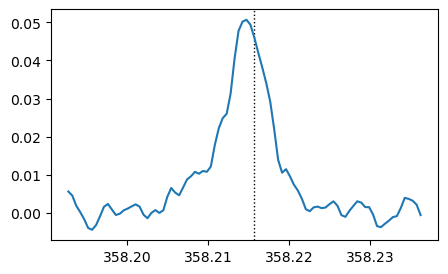

SO2
1-22


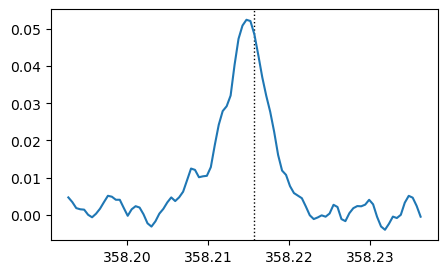

SO2
1-23


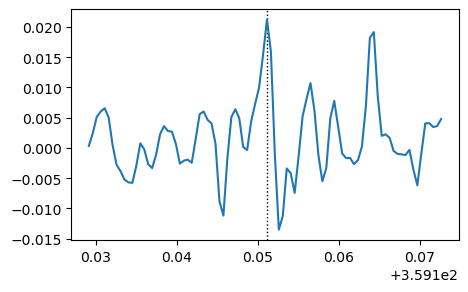

SO2
1-24


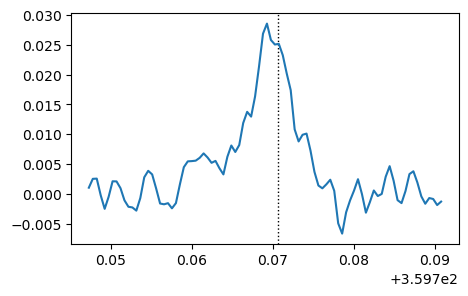

34SO2
2-0


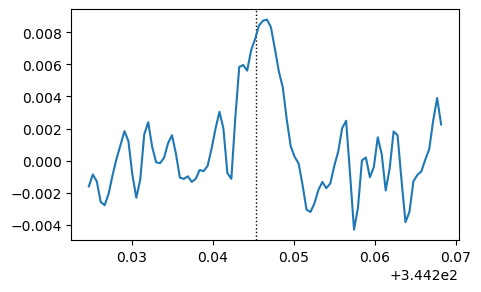

SO
2-1


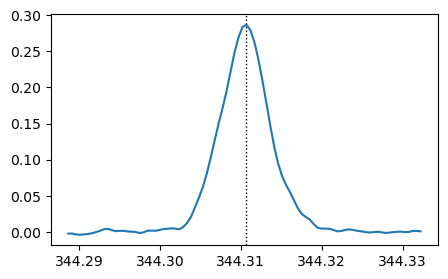

34SO2
2-2


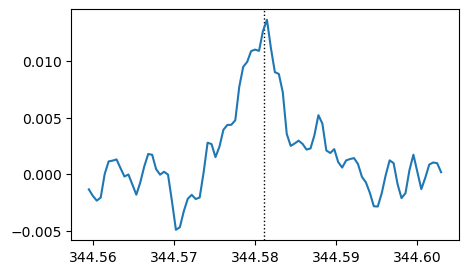

34SO2
2-3


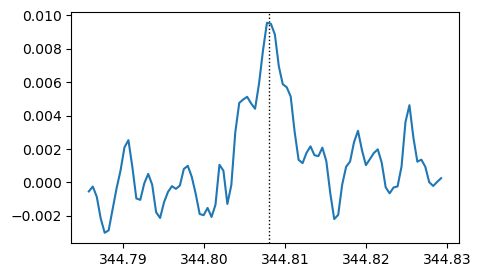

34SO2
2-4


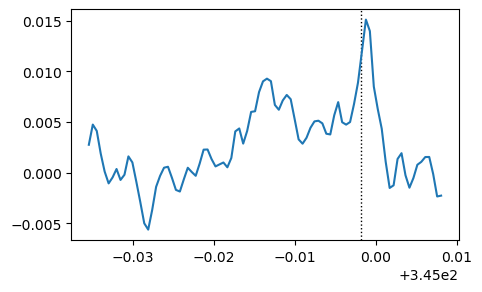

34SO2
2-5


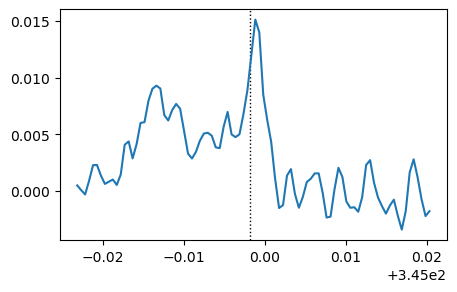

34SO2
2-6


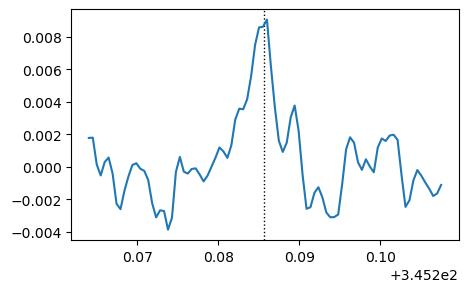

SO2
2-7


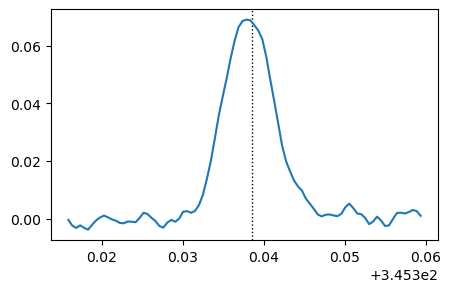

34SO2
2-8


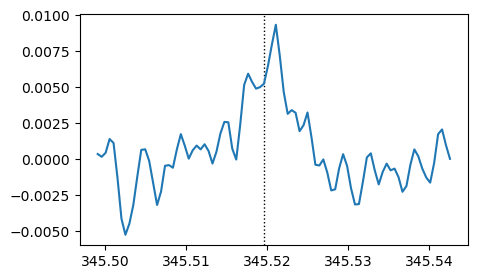

34SO2
2-9


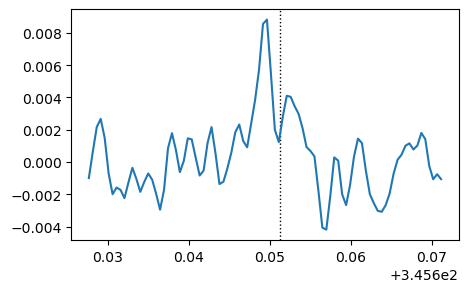

CO
2-10


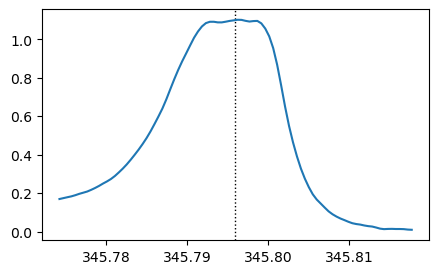

SO
2-11


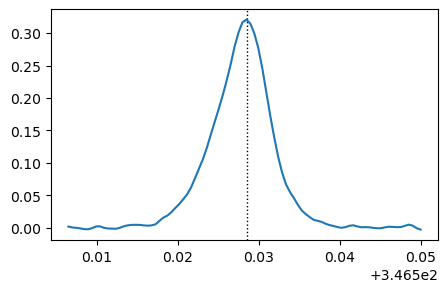

SO2
2-12


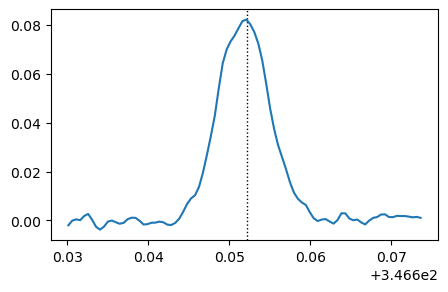

H13CO+
2-13


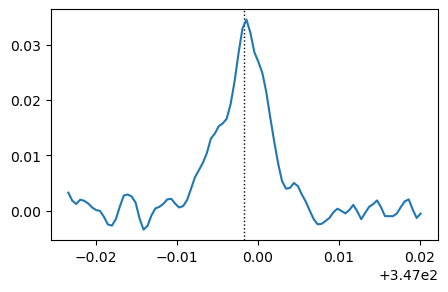

SiO
2-14


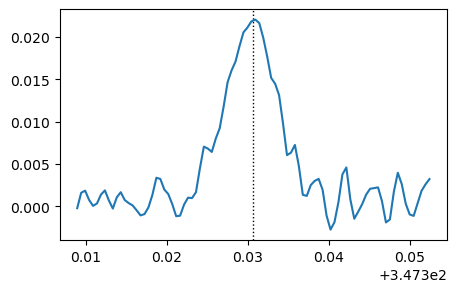

SO+
2-15


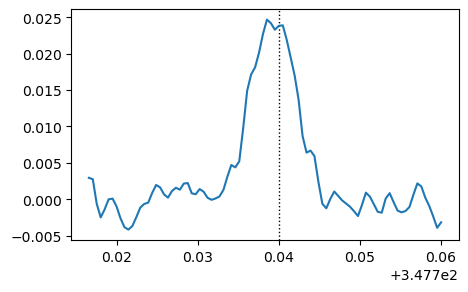

HCO+
2-16


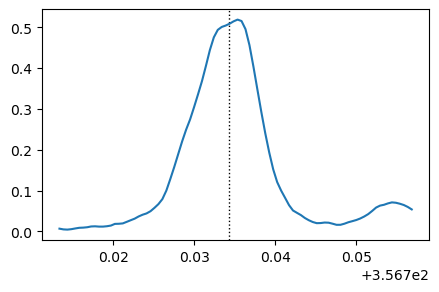

34SO2
2-17


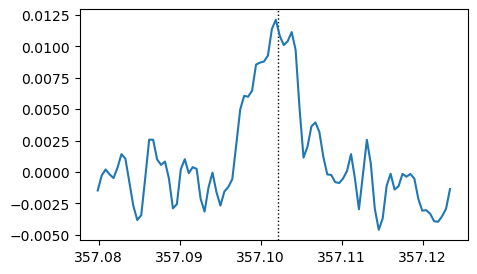

SO2
2-18


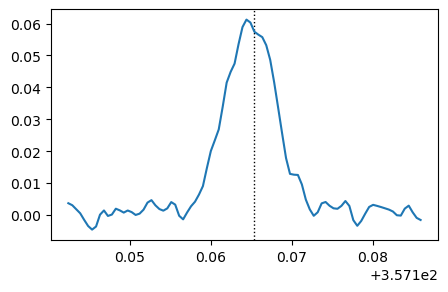

SO2
2-19


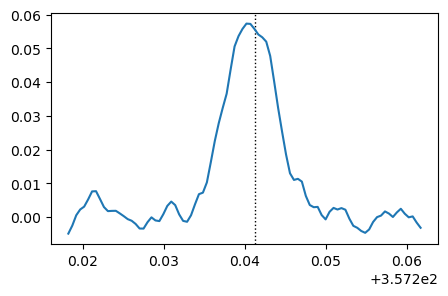

SO2
2-20


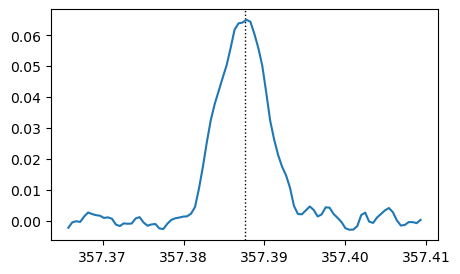

SO2
2-21


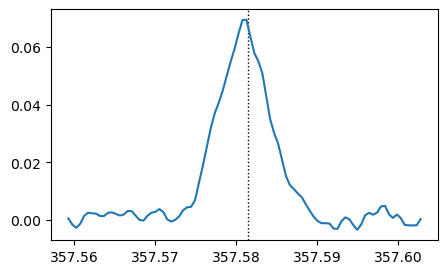

SO2
2-22


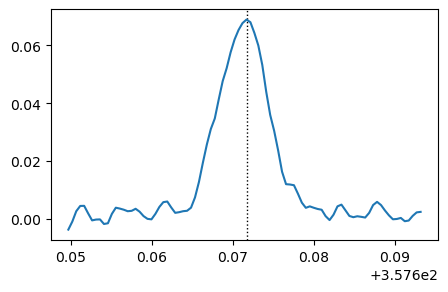

SO2
2-23


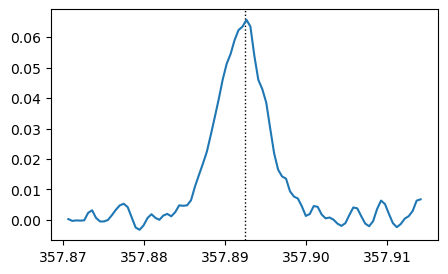

SO2
2-24


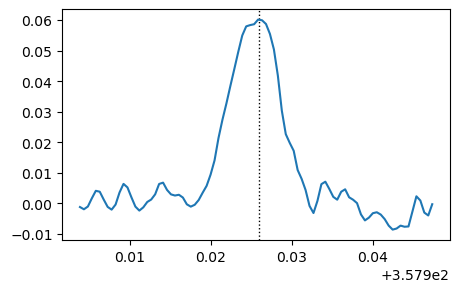

SO2
2-25


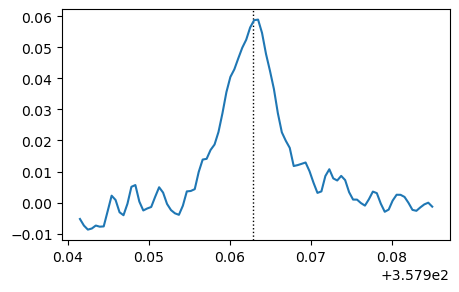

SO2
2-26


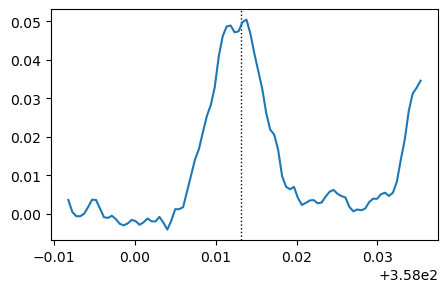

SO2
2-27


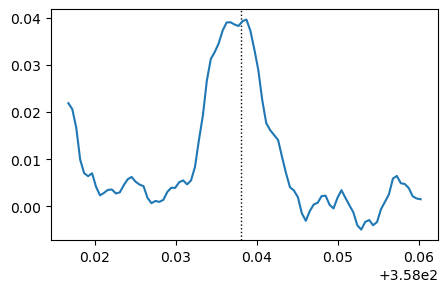

SO2
2-28


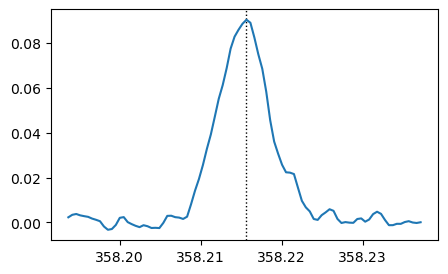

SO2
2-29


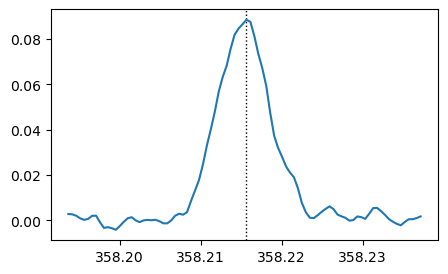

34SO2
2-30


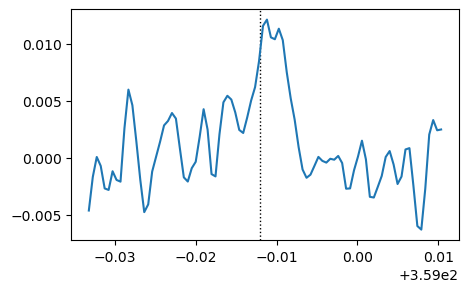

SO2
2-31


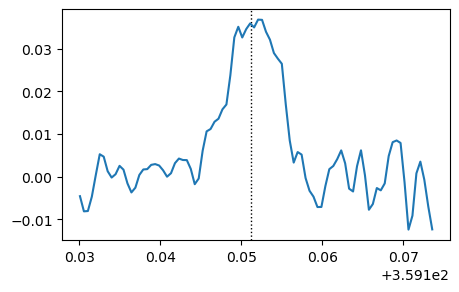

SO2
2-32


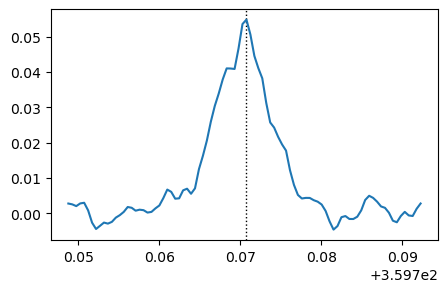

In [13]:
# 人工复检
for n in range(len(x_large)):
    for i in range(len(x_large[n])):
        print(peak_name[n][i])
        print("{}-{}".format(n,i))
        plt.figure(figsize=(5,3))
        plt.axvline(x=peak_fre[n][i], color="black", linestyle=":", linewidth=1)
        plt.plot(x_large[n][i],y_large[n][i])
        plt.show()

In [14]:
# for n in range(len(x_large)):
#     print(len(x_large[n]))
print(len(x_large[0][0]))

90


In [15]:
# 人工删除
shan2=[[19,27],[9],[4]]   # 手动输入需要删掉的谱线
for n in range(len(shan2)):
    for i in range(len(shan2[n])-1,-1,-1):
        del x_large[n][shan2[n][i]]
        del y_large[n][shan2[n][i]]
        del peak_fre[n][shan2[n][i]]
        del peak_name[n][shan2[n][i]]
        
for n in range(len(x_large)):
    print(len(x_large[n]))

40
24
32


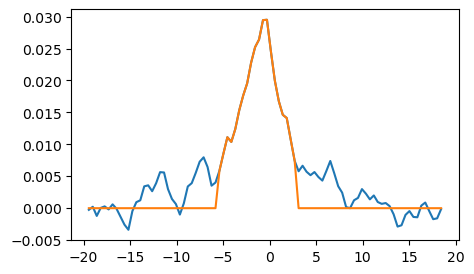

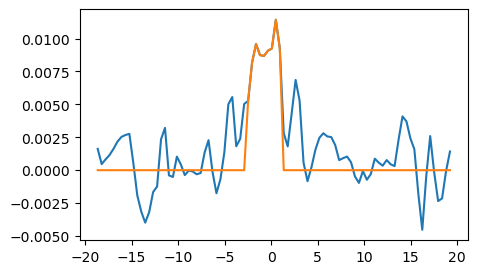

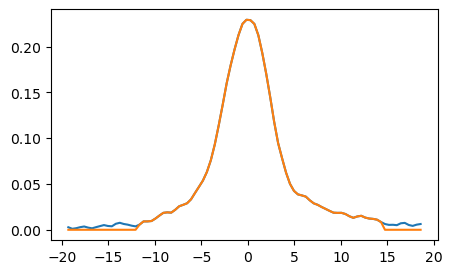

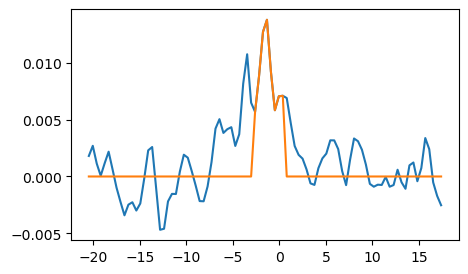

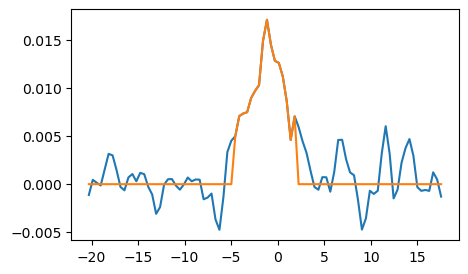

...

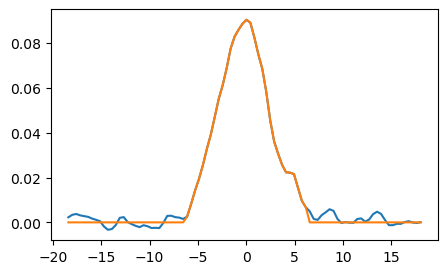

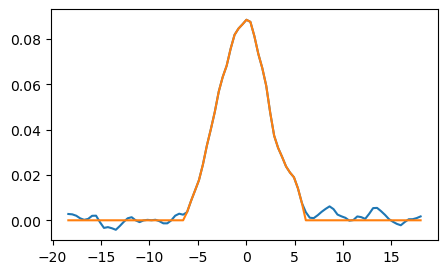

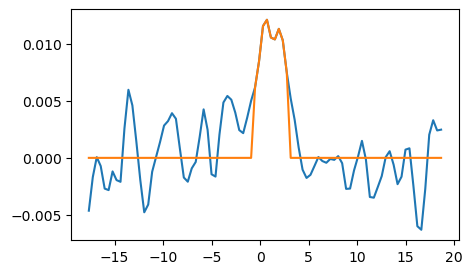

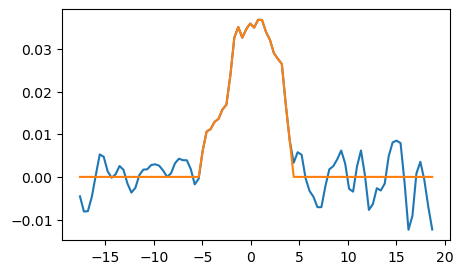

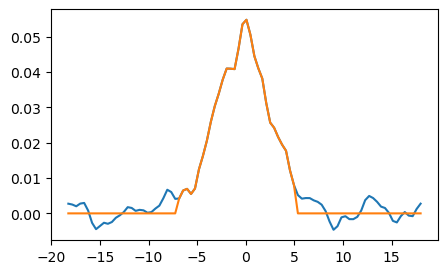

96
96


In [54]:
data_flux=[]

f=[]  # 用来组合成字典的列表
flux=[]

for n in range(len(x_large)):
    for i in range(len(x_large[n])):
        list_x=[]
        list_y=[]
        for j in range(len(x_large[n][i])):            # 把某一个源的某一个峰的列表数据取出来 peak1=x_large[n][i]=[x,x,x,x,x,x]
            list_x.append((c*(x_large[n][i][j]-peak_fre[n][i])/peak_fre[n][i])/1000)   # 将频率转换为速度
            list_y.append(y_large[n][i][j])

    #     list_x_hebin,list_y_hebin=hebin(list_x,list_y)   # 合并

        list_y_3sigma=remove_3sigma3(list_x,list_y,spw_std[n])  # 去除噪声
        #list_y_3sigma=remove_3sigma4(list_x,list_y_3sigma,spw_std)

        list_y_3sigma_nol=guiyihua(list_y_3sigma)   # 归一化

        f.append(list_x)
        flux.append(list_y_3sigma_nol)

        plt.figure(figsize=(5,3))
        plt.plot(list_x,list_y)
        plt.plot(list_x,list_y_3sigma)
        plt.show()
        
print(len(f))
print(len(flux))


In [55]:
# 形状区分源
marker=[]
for n in range(len(peak_name)):
    for i in range(len(peak_name[n])):
        if n==0:
            marker.append("o")
        if n==1:
            marker.append("^")
        if n==2:
            marker.append("s")
            
# 名字
name_source=[]
for n in range(len(peak_name)):
    for i in range(len(peak_name[n])):
        if n==0:
            name_source.append("Lh07-{}".format(peak_name[n][i]))
        if n==1:
            name_source.append("Lh09-{}".format(peak_name[n][i]))
        if n==2:
            name_source.append("Lh10-{}".format(peak_name[n][i]))
            
name=[]
for n in range(len(peak_name)):
    for i in range(len(peak_name[n])):
        name.append(peak_name[n][i])

In [56]:
# 把只有几个点的谱线去掉
shan3=[]

def count_non_zero(lst):
    return len([num for num in lst if num != 0])

for i in range(len(flux)):
    if count_non_zero(flux[i])<10:
        shan3.append(i)

print(len(flux))

for i in range(len(shan3)-1,-1,-1):
    del f[shan3[i]]
    del flux[shan3[i]]
    del marker[shan3[i]]
    del name_source[shan3[i]]
    del name[shan3[i]]
    
print(len(flux))

96
78


In [57]:
# 对齐横坐标
spectra = [
    {"f": f, "flux": flux}
    for f,flux in zip(f, flux)
]

f_new, data_flux = align_spectra_to_grid(spectra, kind='linear')

# 输出结果形状
print("统一频率网格长度:", len(f_new))
print("对齐后的流量矩阵形状:", data_flux.shape)
print(len(data_flux))

统一频率网格长度: 104
对齐后的流量矩阵形状: (78, 104)
78


In [58]:
from sklearn.datasets import load_digits
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE,MDS, Isomap,LocallyLinearEmbedding,SpectralEmbedding
from sklearn.decomposition import PCA

In [59]:
spec=SpectralEmbedding(n_components=3)
digits_spec=spec.fit_transform(data_flux)

# 颜色区分分子
color_map = {'33SO2':'#000000', '13CH3OH???':'#FF0000', 'CO':'#00FF00', 
             'HC15N':'#0000FF', 'CH3OH':'#FFFF00','H13CO+':'#00FFFF','SO+':'#FF00FF',
             'SiO':'#FFA500', 'SO2':'#FFC0CB', 'HCO+':'#FFA07A', 'SO':'#A9A9A9', 'CH3OCH3':'#8B0000',
             '34SO2':'#ADD8E6', 't-HCOOH':'#90EE90', 'HC3N':'#D8BFD8'}



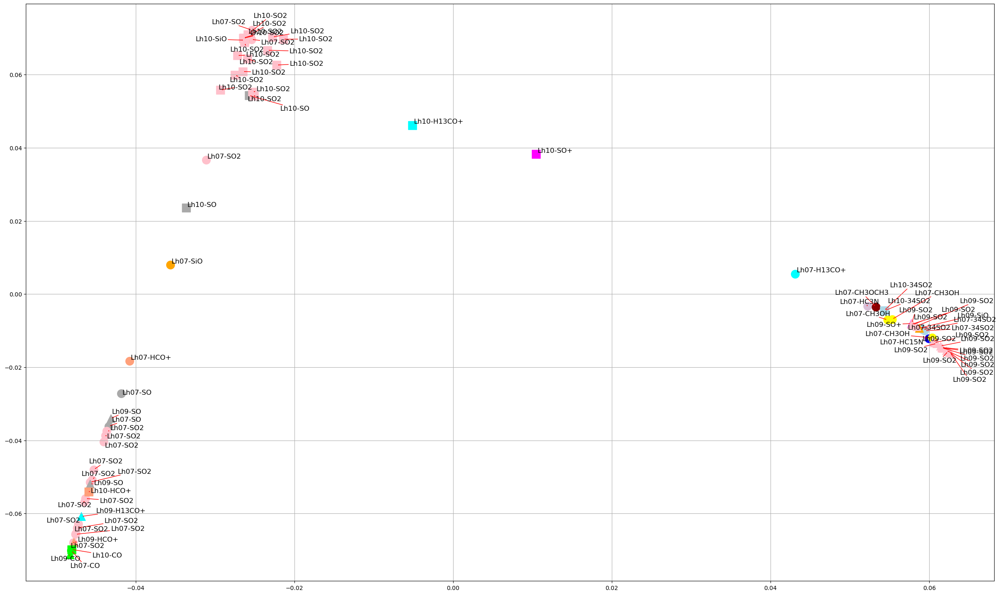

In [60]:
# SpectralEmbedding1
plt.figure(figsize=(30,18))
plt.grid()
# plt.xlim(digits_spec[:,0].min(),digits_spec[:,0].max()+1)
# plt.ylim(digits_spec[:,1].min(),digits_spec[:,1].max()+1)
#plt.xlim(-0.2,0.2)
for i in range(len(digits_spec)):
#     plt.text(digits_spec[i,0],digits_spec[i,1],str(new_name[i]),
#              color=colors[i],
#              fontdict={'weight':'bold','size':15})
    plt.scatter(digits_spec[i, 0], digits_spec[i, 1], color=color_map[name[i]], label=name_source[i], marker=marker[i], s=200)
    
new_texts = [plt.text(x_, y_, text, fontsize=12) for x_, y_, text in zip(digits_spec[:, 0], digits_spec[:, 1], name_source)]
adjust_text(new_texts,arrowprops=dict(arrowstyle='->',color='red',lw=1))

# plt.legend(ncol=3)
plt.show()

In [61]:
# 求平均谱线
def mean_spec(list7):
    mean=[]
    for i in range(len(list7[0])):  # 数据长度
        mean_data=0
        for j in range(len(list7)):   # 有几组数据
            mean_data+=list7[j][i]
        mean.append(mean_data/len(list7))
    return mean

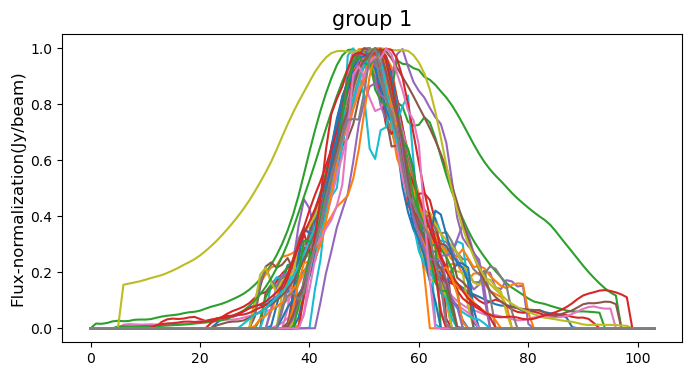

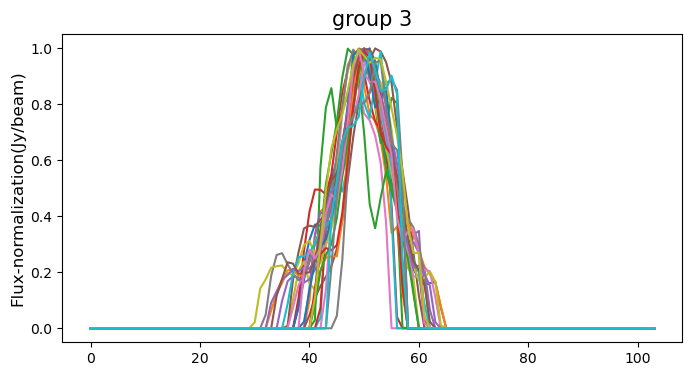

In [62]:
# 将每组谱线画出来
cate1=[]
name1=[]
mean1=[]
cate2=[]
name2=[]
mean2=[]
cate3=[]
name3=[]
mean3=[]
for i in range(len(digits_spec)):
    if digits_spec[i,0]<0:
        cate1.append(data_flux[i])
        name1.append(name_source[i])
        
#     elif 0.05>digits_spec[i,0]:
#         cate2.append(data_flux[i])
#         name2.append(peak_name[i])
        
    elif digits_spec[i,0]>0:
        cate3.append(data_flux[i])
        name3.append(name_source[i])

# 求平均光谱
mean1=mean_spec(cate1)
# mean2=mean_spec(cate2)
mean3=mean_spec(cate3)

# 画图
plt.figure(figsize=(8,4))
for i in range(len(cate1)):  
    plt.plot(cate1[i],label=name_source[i])

#plt.plot(mean1,linewidth=10,color="b")
plt.title("group 1",fontsize=15)
plt.ylabel("Flux-normalization(Jy/beam)",fontsize=12)
#plt.ylim(-0.05,0.1)
# plt.legend(ncol=2)
plt.show()

# plt.figure(figsize=(8,4))
# for i in range(len(cate2)):
#     plt.plot(cate2[i],label=name2[i])

# #plt.plot(mean2,linewidth=10,color="b")
# plt.title("group 2",fontsize=15)
# plt.ylabel("Flux-normalization(Jy/beam)",fontsize=12)
# #plt.xlim(25,150)
# plt.legend()
# plt.show()

plt.figure(figsize=(8,4))
for i in range(len(cate3)):
    plt.plot(cate3[i],label=name_source[i])

#plt.plot(mean3,linewidth=10,color="b")
plt.title("group 3",fontsize=15)
plt.ylabel("Flux-normalization(Jy/beam)",fontsize=12)
#plt.xlim(25,150)
# plt.legend()
plt.show()